# Kalibrasi FHP dengan pendekatan ANN

Pengujian FHP dilakukan dengan langkah seperti berikut:

1. Mengumpulkan data hasil pengujian di terowongan angin yang merupakan nilai tekanan terukur pada setiap lubang probe untuk setiap posisi sudut serang, sudut selip, dan kecepatan aliran tertentu.
2. Melakukan pengecekan data mirroring untuk setiap posisi yang bersesuaian.
3. Melakukan pengujian untuk satu kuadran yang diwakili oleh sudut serang dengan range 0 s/d 20 interval 5 derajat, sudut selip dengan range 0 s/d 90 interval 5 derajat, dan kecepatan dengan range 10 s/d 50 interval 10 m/s.
4. Melakukan pengujian untuk kuadran lainnya yang diwakili oleh sudut serang dengan range (-20) s/d 20 interval 10 derajat, sudut selip dengan range 0 s/d (-30) interval 5 derajat, dan kecepatan dengan range 10 s/d 50 interval 10 m/s.
5. Mengelompokkan data tekanan yang terukur dengan posisi sudut serang, sudut selip, dan kecepatan yang aktual.

In [2]:
# Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import random, time
from mpl_toolkits.mplot3d import Axes3D
from hyperopt import fmin, tpe, hp, Trials
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from keras.optimizers import Adam, SGD, RMSprop, Adadelta, Adagrad, Adamax, Nadam, Ftrl
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, max_error
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import load_model

## Load semua data dan digabungkan menjadi satu dataframe

In [39]:
# Set options to display all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [221]:
Data_All_Avg = pd.read_csv('Data_All_rev.csv').drop(columns=['ps','pt-wt','ps-wt'])
Data_All_Avg

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
0,0.00842,0.00000,0.00337,0.00842,0.05892,10.011648,0,0
1,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
2,0.00842,0.00337,0.00505,0.00842,0.05892,10.011648,0,0
3,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
4,0.01178,0.00337,0.00337,0.00842,0.05724,10.011648,0,0
5,0.00673,0.00168,0.00168,0.00673,0.05555,10.011648,0,0
6,0.00842,0.00505,0.00505,0.00842,0.05892,10.011648,0,0
7,0.00842,0.00505,0.00673,0.00842,0.05724,10.011648,0,0
8,0.00842,0.00337,0.00673,0.00842,0.05892,10.011648,0,0
9,0.00842,0.00168,0.00337,0.00842,0.05724,10.011648,0,0


# ---------------------------------------------------------------

# Proses pendekatan ANN menggunakan semua titik pengujian

### Pemilihan Data Random untuk data primary

In [222]:
# Pembagian data train
X_train1, X_val1, y_train1, y_val1 = train_test_split(Data_All_Avg.drop(columns=['V','α','β'], axis=1),
                                                  Data_All_Avg[['V','α','β']],
                                                  test_size=0.2, random_state=42)
# Menyimpan DataFrame ke dalam file CSV
#X_train1.to_csv('X_train_All_raw.csv', index=False)
# Menyimpan DataFrame ke dalam file CSV
#X_val1.to_csv('X_val_All_raw.csv', index=False)
# Menyimpan DataFrame ke dalam file CSV
#y_train1.to_csv('y_train_All_raw.csv', index=False)
# Menyimpan DataFrame ke dalam file CSV
#y_val1.to_csv('y_val_All_raw.csv', index=False)

In [223]:
X_train1

,Pβ2,Pα1,Pβ1,Pα2,P3
3377,-0.07744,0.75585,-0.74406,-0.92419,0.14814
4865,-1.34672,0.03198,-1.50664,-1.11273,-1.27265
4725,-0.44778,0.33668,-0.63128,-0.69861,-0.36530
3770,-0.82487,-0.07744,-0.85180,-0.60602,-0.78615
1027,0.01515,0.02525,-0.00505,-0.01347,0.05892
5888,0.01683,-0.14982,0.00000,0.22389,0.45452
1966,-2.14465,0.10942,-2.27428,-1.65647,-1.95948
349,-0.06902,0.62286,-0.09932,-0.49997,0.69356
6699,-1.11441,-1.21878,0.47472,0.91072,0.59761
662,-0.35015,0.02357,-0.36530,-0.28955,-0.31648


In [224]:
len(X_train1)

5400

In [7]:
filtered = y_train1[y_train1['α'] >= 75]
filtered

,V,α,β
4865,40.029763,75,-20
3770,30.013600,80,-15
1966,50.045034,75,-5
662,20.022146,75,0
2572,10.062151,80,-10
881,40.045325,85,0
2876,39.986842,80,-10
4977,50.069872,80,-20
3787,29.990107,85,-15
879,40.020882,80,0


In [8]:
len(filtered)

816

### Pemilihan Data Selected

In [9]:
data_filtered = Data_All_Avg[Data_All_Avg['α'] >= 75]
data_filtered

,Pβ2,Pα1,Pβ1,Pα2,P3,ps,pt-wt,ps-wt,V,α,β
560,-0.08585,0.00842,-0.09259,-0.07575,-0.07239,-0.03535,0.06565,0.00000,10.057256,75,0
561,-0.08249,0.01010,-0.09259,-0.07239,-0.07070,-0.03030,0.06565,0.00337,10.057256,75,0
562,-0.08417,0.01178,-0.08754,-0.07239,-0.07239,-0.03198,0.06397,0.00168,10.057256,75,0
563,-0.08585,0.00842,-0.09090,-0.07575,-0.07407,-0.03367,0.06397,0.00000,10.057256,75,0
564,-0.08585,0.00842,-0.08922,-0.07407,-0.07239,-0.03703,0.06397,0.00168,10.057256,75,0
565,-0.08417,0.01010,-0.09090,-0.07407,-0.07239,-0.03367,0.06397,0.00168,10.057256,75,0
566,-0.08417,0.01010,-0.09259,-0.07407,-0.07407,-0.03367,0.06397,0.00168,10.057256,75,0
567,-0.08754,0.00842,-0.09259,-0.07407,-0.07407,-0.03535,0.06397,0.00000,10.057256,75,0
568,-0.08585,0.00842,-0.09259,-0.07407,-0.07239,-0.03535,0.06565,0.00000,10.057256,75,0
569,-0.08754,0.00842,-0.09259,-0.07407,-0.07407,-0.03367,0.06397,0.00168,10.057256,75,0


In [10]:
data_filtered2 = Data_All_Avg[Data_All_Avg['α'] < 75]
data_filtered2

,Pβ2,Pα1,Pβ1,Pα2,P3,ps,pt-wt,ps-wt,V,α,β
0,0.00842,0.00000,0.00337,0.00842,0.05892,0.00673,0.06060,0.00000,10.011648,0,0
1,0.01010,0.00168,0.00337,0.00842,0.05724,0.00673,0.06060,0.00000,10.011648,0,0
2,0.00842,0.00337,0.00505,0.00842,0.05892,0.00842,0.06060,0.00168,10.011648,0,0
3,0.01010,0.00168,0.00337,0.00842,0.05724,0.00842,0.06060,0.00168,10.011648,0,0
4,0.01178,0.00337,0.00337,0.00842,0.05724,0.00842,0.06060,0.00000,10.011648,0,0
5,0.00673,0.00168,0.00168,0.00673,0.05555,0.00673,0.05892,-0.00168,10.011648,0,0
6,0.00842,0.00505,0.00505,0.00842,0.05892,0.00842,0.06060,0.00000,10.011648,0,0
7,0.00842,0.00505,0.00673,0.00842,0.05724,0.00842,0.06060,0.00000,10.011648,0,0
8,0.00842,0.00337,0.00673,0.00842,0.05892,0.00842,0.06060,0.00000,10.011648,0,0
9,0.00842,0.00168,0.00337,0.00842,0.05724,0.00842,0.06060,0.00000,10.011648,0,0


In [12]:
len(data_filtered)

1000

In [69]:
# Pembagian data train
X_train2l, X_val2, y_train2l, y_val2 = train_test_split(data_filtered2.drop(columns=['V','α','β'], axis=1),
                                                  data_filtered2[['V','α','β']],
                                                  test_size=0.23472, random_state=42)

X_train2 = pd.concat([X_train2l, data_filtered.drop(columns=['V','α','β'], axis=1)])
y_train2 = pd.concat([y_train2l, data_filtered[['V','α','β']]])

In [70]:
len(y_train2)

5400

## Pengembangan Model ANN

### ANN Model 1

#### Mencari jumlah Neuron yang optimal
Pada tahap ini, akan dicari jumlah neuron yang optimal untuk hidden layer pertama dengan rentang neuron dari 10, 30, 50, 70, dan 90. setelah didapatkan nilai Loss yang paling minimum, pencarian jumlah neuron dilanjutkan secara lebih detail pada area tersebut. Area pencarian dibatasi pada jumlah neuron 100.

In [72]:
# Rentang jumlah neuron yang ingin dieksplorasi
#neuron_range = range(16, 100)
neuron_range = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# List untuk menyimpan loss
losses1N_val = []
losses1N = []

# Membuat dan melatih model untuk setiap jumlah neuron
for num_neurons in neuron_range:
    np.random.seed(42)
    random.seed(42)
    tf.random.set_seed(42)
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train1.shape[1], activation='tanh'))
    model.add(Dense(y_train1.shape[1], activation='linear'))
    model.compile(loss='mean_absolute_error', optimizer='adam')
    history1N = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=1000, batch_size=16, verbose=0)
    loss1N_val = history1N.history['val_loss'][-1]  # Mengambil loss pada epoch terakhir
    loss1N = history1N.history['loss'][-1]  # Mengambil loss pada epoch terakhir
    losses1N_val.append(loss1N_val)
    losses1N.append(loss1N)

np.save('losses1N_val_All_raw.npy', losses1N_val)
np.save('losses1N_All_raw.npy', losses1N)


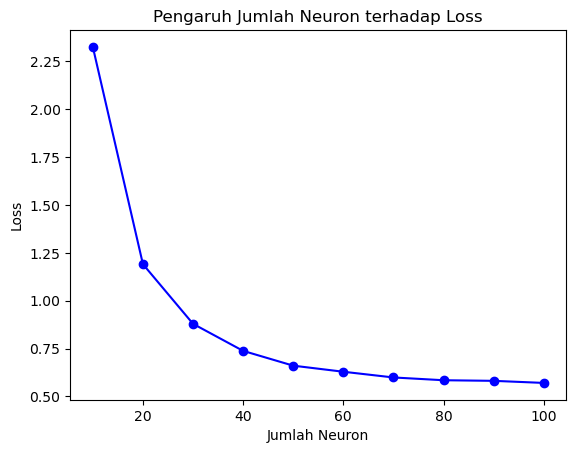

In [73]:
# Plot pengaruh jumlah neuron terhadap loss
plt.plot(neuron_range, losses1N_val, 'bo-')
plt.xlabel('Jumlah Neuron')
plt.ylabel('Loss')
plt.title('Pengaruh Jumlah Neuron terhadap Loss')
plt.show()

In [129]:
# Rentang jumlah neuron yang ingin dieksplorasi
neuron_range = [80,85,90,95,100]

# List untuk menyimpan loss
losses1N_val_2 = []
losses1N_2 = []

# Membuat dan melatih model untuk setiap jumlah neuron
for num_neurons in neuron_range:
    np.random.seed(42)
    random.seed(42)
    tf.random.set_seed(42)
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train1.shape[1], activation='tanh'))
    model.add(Dense(y_train1.shape[1], activation='linear'))
    model.compile(loss='mean_absolute_error', optimizer='adam')
    history1N = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=1000, batch_size=16, verbose=0)
    loss1N_val = history1N.history['val_loss'][-1]  # Mengambil loss pada epoch terakhir
    loss1N = history1N.history['loss'][-1]  # Mengambil loss pada epoch terakhir
    losses1N_val_2.append(loss1N_val)
    losses1N_2.append(loss1N)

np.save('losses1N_val_All1_raw_rev.npy', losses1N_val_2)
np.save('losses1N_All1_raw_rev.npy', losses1N_2)


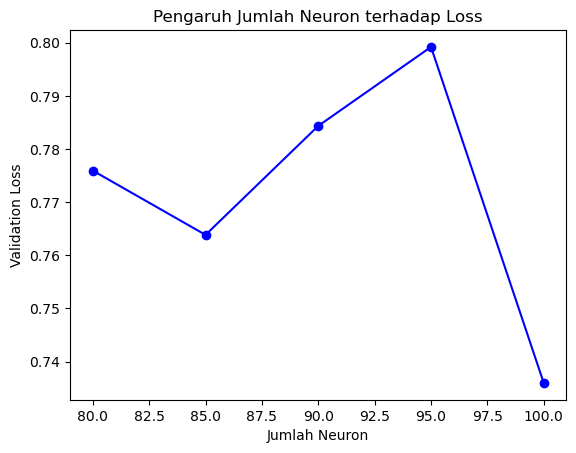

In [130]:
# Plot pengaruh jumlah neuron terhadap loss
plt.plot(neuron_range, losses1N_val_2, 'bo-')
plt.xlabel('Jumlah Neuron')
plt.ylabel('Validation Loss')
plt.title('Pengaruh Jumlah Neuron terhadap Loss')
plt.show()

In [77]:
losses1N_val_2

[0.5986336469650269,
 0.5974065661430359,
 0.5609966516494751,
 0.5701294541358948,
 0.5677438378334045,
 0.5814204216003418,
 0.5748375058174133,
 0.5875975489616394,
 0.5823965072631836,
 0.5698122978210449,
 0.5730181932449341,
 0.5661731958389282,
 0.5563132166862488,
 0.5871919989585876,
 0.5774652361869812,
 0.5705346465110779]

In [219]:
X_train1

,Pβ2,Pα1,Pβ1,Pα2,P3
222,0.01347,0.19864,0.00168,-0.13131,0.46462
2421,0.50670,0.50839,-0.48650,-0.48314,1.18848
4438,0.78446,0.55047,-0.92755,-0.82318,0.89725
2423,0.50670,0.50839,-0.48819,-0.48314,1.18848
3243,0.17676,0.31311,-0.27439,-0.31143,0.31480
2449,0.29460,0.92924,-0.56394,-0.91409,0.96291
1257,-0.00505,0.41243,-0.16666,-0.34173,0.31480
5703,-0.02357,-0.04714,-0.02188,0.04882,0.01852
6139,-0.10100,-0.15824,0.01347,0.18181,0.12962
6560,-0.33163,-0.34846,0.23736,0.28113,0.27944


In [225]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

losses1_val=[]
losses1=[]

model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')
    
start_time = time.time()
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=2000, batch_size=16)
end_time = time.time()
loss = history.history['loss'][-1]
loss_val = history.history['val_loss'][-1]
losses1.append(loss)
losses1_val.append(loss_val)

np.save('losses2N_val_All2_raw_rev.npy', losses1_val)
np.save('losses2N_All2_raw_rev.npy', losses1)

Epoch 1/2000
338/338 [==============================] - 2s 3ms/step - loss: 748.9833 - val_loss: 394.6772
Epoch 2/2000
338/338 [==============================] - 1s 2ms/step - loss: 315.4754 - val_loss: 262.4099
Epoch 3/2000
338/338 [==============================] - 1s 2ms/step - loss: 232.1171 - val_loss: 200.4368
Epoch 4/2000
338/338 [==============================] - 1s 2ms/step - loss: 185.9468 - val_loss: 169.0439
Epoch 5/2000
338/338 [==============================] - 1s 2ms/step - loss: 160.2991 - val_loss: 147.6696
Epoch 6/2000
338/338 [==============================] - 1s 2ms/step - loss: 140.9548 - val_loss: 130.8220
Epoch 7/2000
338/338 [==============================] - 1s 2ms/step - loss: 124.8011 - val_loss: 115.5971
Epoch 8/2000
338/338 [==============================] - 1s 2ms/step - loss: 110.8034 - val_loss: 103.2418
Epoch 9/2000
338/338 [==============================] - 1s 2ms/step - loss: 99.4386 - val_loss: 93.0989
Epoch 10/2000
338/338 [=========================

338/338 [==============================] - 1s 2ms/step - loss: 4.7528 - val_loss: 4.4630
Epoch 159/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.7354 - val_loss: 4.4353
Epoch 160/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.7081 - val_loss: 4.3775
Epoch 161/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.7117 - val_loss: 4.4127
Epoch 162/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.7037 - val_loss: 4.3839
Epoch 163/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.6824 - val_loss: 4.3867
Epoch 164/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.6866 - val_loss: 4.3956
Epoch 165/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.6474 - val_loss: 4.3343
Epoch 166/2000
338/338 [==============================] - 1s 3ms/step - loss: 4.6531 - val_loss: 4.3440
Epoch 167/2000
338/338 [==============================] - 1s 2ms/step - loss: 4

Epoch 237/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.1472 - val_loss: 3.8407
Epoch 238/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.1189 - val_loss: 3.8016
Epoch 239/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.0974 - val_loss: 3.8420
Epoch 240/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.1145 - val_loss: 3.7868
Epoch 241/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.0933 - val_loss: 3.8418
Epoch 242/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.1059 - val_loss: 3.7759
Epoch 243/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.0948 - val_loss: 3.7912
Epoch 244/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.0922 - val_loss: 3.7515
Epoch 245/2000
338/338 [==============================] - 1s 2ms/step - loss: 4.0826 - val_loss: 3.8642
Epoch 246/2000
338/338 [==============================] - 1s 2ms

Epoch 316/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.8020 - val_loss: 3.5409
Epoch 317/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7766 - val_loss: 3.4802
Epoch 318/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7977 - val_loss: 3.5159
Epoch 319/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7915 - val_loss: 3.4993
Epoch 320/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7895 - val_loss: 3.5278
Epoch 321/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7884 - val_loss: 3.4779
Epoch 322/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7716 - val_loss: 3.5383
Epoch 323/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7751 - val_loss: 3.5264
Epoch 324/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.7762 - val_loss: 3.4691
Epoch 325/2000
338/338 [==============================] - 1s 2ms

Epoch 395/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6164 - val_loss: 3.3386
Epoch 396/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6080 - val_loss: 3.3139
Epoch 397/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6060 - val_loss: 3.3548
Epoch 398/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6116 - val_loss: 3.2855
Epoch 399/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6093 - val_loss: 3.3690
Epoch 400/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6087 - val_loss: 3.3810
Epoch 401/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.6098 - val_loss: 3.2976
Epoch 402/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.5851 - val_loss: 3.2674
Epoch 403/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.5964 - val_loss: 3.2916
Epoch 404/2000
338/338 [==============================] - 1s 2ms

Epoch 474/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4614 - val_loss: 3.2273
Epoch 475/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4664 - val_loss: 3.1703
Epoch 476/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4747 - val_loss: 3.2592
Epoch 477/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4666 - val_loss: 3.1991
Epoch 478/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4573 - val_loss: 3.1570
Epoch 479/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4550 - val_loss: 3.2672
Epoch 480/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4577 - val_loss: 3.1517
Epoch 481/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4582 - val_loss: 3.1732
Epoch 482/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.4446 - val_loss: 3.1636
Epoch 483/2000
338/338 [==============================] - 1s 2ms

Epoch 553/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3439 - val_loss: 3.1770
Epoch 554/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3641 - val_loss: 3.0908
Epoch 555/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3617 - val_loss: 3.0804
Epoch 556/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3449 - val_loss: 3.0831
Epoch 557/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3507 - val_loss: 3.1227
Epoch 558/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3316 - val_loss: 3.0984
Epoch 559/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3621 - val_loss: 3.0980
Epoch 560/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3459 - val_loss: 3.0761
Epoch 561/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.3545 - val_loss: 3.0634
Epoch 562/2000
338/338 [==============================] - 1s 3ms

Epoch 632/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2726 - val_loss: 2.9793
Epoch 633/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2632 - val_loss: 2.9939
Epoch 634/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2532 - val_loss: 3.0450
Epoch 635/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2550 - val_loss: 3.0107
Epoch 636/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2640 - val_loss: 3.0018
Epoch 637/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2555 - val_loss: 2.9957
Epoch 638/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2598 - val_loss: 2.9759
Epoch 639/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2715 - val_loss: 2.9639
Epoch 640/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2593 - val_loss: 3.0462
Epoch 641/2000
338/338 [==============================] - 1s 2ms

Epoch 711/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2060 - val_loss: 2.9803
Epoch 712/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1891 - val_loss: 2.9401
Epoch 713/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1959 - val_loss: 3.0353
Epoch 714/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2062 - val_loss: 2.9279
Epoch 715/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2104 - val_loss: 2.9447
Epoch 716/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1942 - val_loss: 2.9574
Epoch 717/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1910 - val_loss: 2.9508
Epoch 718/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1870 - val_loss: 2.9286
Epoch 719/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.2225 - val_loss: 2.9709
Epoch 720/2000
338/338 [==============================] - 1s 2ms

Epoch 790/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1580 - val_loss: 2.8846
Epoch 791/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1262 - val_loss: 2.8581
Epoch 792/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1577 - val_loss: 2.8822
Epoch 793/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1515 - val_loss: 2.8713
Epoch 794/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1501 - val_loss: 2.8436
Epoch 795/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1465 - val_loss: 2.9023
Epoch 796/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1434 - val_loss: 2.9232
Epoch 797/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1512 - val_loss: 2.9199
Epoch 798/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1315 - val_loss: 2.8738
Epoch 799/2000
338/338 [==============================] - 1s 2ms

Epoch 869/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0905 - val_loss: 2.8181
Epoch 870/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1107 - val_loss: 2.8612
Epoch 871/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0896 - val_loss: 2.9222
Epoch 872/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1116 - val_loss: 2.8162
Epoch 873/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1011 - val_loss: 2.8528
Epoch 874/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0958 - val_loss: 2.8285
Epoch 875/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0977 - val_loss: 2.8059
Epoch 876/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0916 - val_loss: 2.8492
Epoch 877/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.1033 - val_loss: 2.8444
Epoch 878/2000
338/338 [==============================] - 1s 2ms

Epoch 948/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0567 - val_loss: 2.7876
Epoch 949/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0614 - val_loss: 2.8061
Epoch 950/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0832 - val_loss: 2.8501
Epoch 951/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0859 - val_loss: 2.7872
Epoch 952/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0624 - val_loss: 2.8311
Epoch 953/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0592 - val_loss: 2.7994
Epoch 954/2000
338/338 [==============================] - 1s 3ms/step - loss: 3.0657 - val_loss: 2.8050
Epoch 955/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0632 - val_loss: 2.8308
Epoch 956/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0704 - val_loss: 2.8000
Epoch 957/2000
338/338 [==============================] - 1s 2ms

338/338 [==============================] - 1s 2ms/step - loss: 2.9992 - val_loss: 2.7143
Epoch 1105/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9903 - val_loss: 2.7477
Epoch 1106/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9903 - val_loss: 2.7347
Epoch 1107/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9950 - val_loss: 2.7130
Epoch 1108/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9888 - val_loss: 2.6866
Epoch 1109/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9845 - val_loss: 2.8340
Epoch 1110/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0018 - val_loss: 2.7505
Epoch 1111/2000
338/338 [==============================] - 1s 2ms/step - loss: 3.0086 - val_loss: 2.8123
Epoch 1112/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9974 - val_loss: 2.7058
Epoch 1113/2000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.9618 - val_loss: 2.7011
Epoch 1261/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9332 - val_loss: 2.7605
Epoch 1262/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9580 - val_loss: 2.7053
Epoch 1263/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9427 - val_loss: 2.6985
Epoch 1264/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9406 - val_loss: 2.7254
Epoch 1265/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9550 - val_loss: 2.7243
Epoch 1266/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9311 - val_loss: 2.7830
Epoch 1267/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9388 - val_loss: 2.7415
Epoch 1268/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9407 - val_loss: 2.6769
Epoch 1269/2000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.8955 - val_loss: 2.6697
Epoch 1417/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8886 - val_loss: 2.6464
Epoch 1418/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9026 - val_loss: 2.7041
Epoch 1419/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8853 - val_loss: 2.6941
Epoch 1420/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9139 - val_loss: 2.6981
Epoch 1421/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8838 - val_loss: 2.6229
Epoch 1422/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9065 - val_loss: 2.7023
Epoch 1423/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9062 - val_loss: 2.6808
Epoch 1424/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.9275 - val_loss: 2.6431
Epoch 1425/2000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.8478 - val_loss: 2.6371
Epoch 1573/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8476 - val_loss: 2.7659
Epoch 1574/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8684 - val_loss: 2.7647
Epoch 1575/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8516 - val_loss: 2.7001
Epoch 1576/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8544 - val_loss: 2.5797
Epoch 1577/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8536 - val_loss: 2.6137
Epoch 1578/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8567 - val_loss: 2.6260
Epoch 1579/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8483 - val_loss: 2.6010
Epoch 1580/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8473 - val_loss: 2.6523
Epoch 1581/2000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.8310 - val_loss: 2.6057
Epoch 1729/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8410 - val_loss: 2.7731
Epoch 1730/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8298 - val_loss: 2.6174
Epoch 1731/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8210 - val_loss: 2.6113
Epoch 1732/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8327 - val_loss: 2.5847
Epoch 1733/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8209 - val_loss: 2.6053
Epoch 1734/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8440 - val_loss: 2.7106
Epoch 1735/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8242 - val_loss: 2.6003
Epoch 1736/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8102 - val_loss: 2.5700
Epoch 1737/2000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.8073 - val_loss: 2.6632
Epoch 1885/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.7839 - val_loss: 2.5767
Epoch 1886/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.7967 - val_loss: 2.6393
Epoch 1887/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.7900 - val_loss: 2.6356
Epoch 1888/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8096 - val_loss: 2.5341
Epoch 1889/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.8059 - val_loss: 2.6002
Epoch 1890/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.7854 - val_loss: 2.5431
Epoch 1891/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.7951 - val_loss: 2.5483
Epoch 1892/2000
338/338 [==============================] - 1s 2ms/step - loss: 2.7957 - val_loss: 2.6538
Epoch 1893/2000
338/338 [==============================] - 1s 2ms/step 

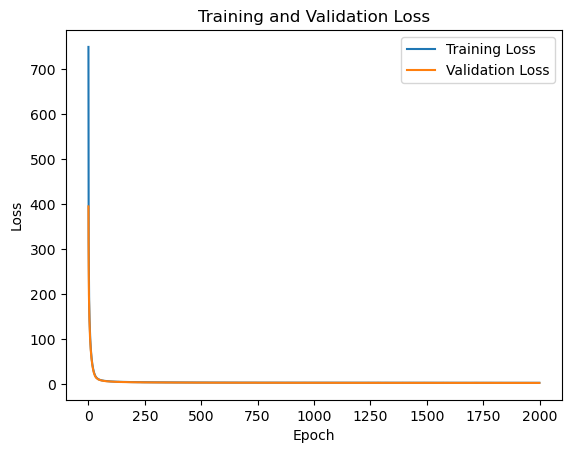

In [232]:
# Membuat plot untuk loss tiap epoch
#plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

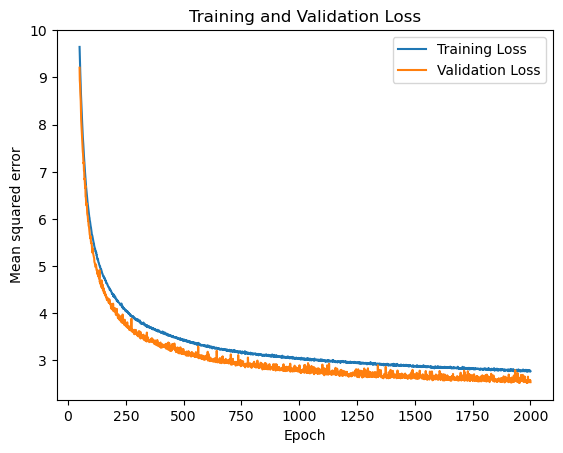

In [234]:
# Membuat plot untuk loss pada rentang epoch tertentu
start_epoch = 50
end_epoch = 2000

#plt.figure(figsize=(12, 6))
plt.plot(range(start_epoch, end_epoch + 1), history.history['loss'][start_epoch-1:end_epoch], label='Training Loss')
plt.plot(range(start_epoch, end_epoch + 1), history.history['val_loss'][start_epoch-1:end_epoch], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Mean squared error')
plt.legend()
plt.show()

In [235]:
# Mencari index epoch dengan val_loss minimum
min_val_loss_epoch = np.argmin(history.history['val_loss']) + 1  # +1 karena indeks dimulai dari 0

# Menyimpan val_loss minimum
min_val_loss = history.history['val_loss'][min_val_loss_epoch - 1]

print(f"Epoch dengan val_loss minimum: {min_val_loss_epoch}")
print(f"Nilai val_loss minimum: {min_val_loss}")

Epoch dengan val_loss minimum: 1953
Nilai val_loss minimum: 2.523528814315796


In [248]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

losses1_val=[]
losses1=[]

model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(97, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')
    
start_time = time.time()
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=3000, batch_size=16)
end_time = time.time()
loss = history.history['loss'][-1]
loss_val = history.history['val_loss'][-1]
losses1.append(loss)
losses1_val.append(loss_val)

Epoch 1/3000
338/338 [==============================] - 2s 3ms/step - loss: 481.4093 - val_loss: 234.1855
Epoch 2/3000
338/338 [==============================] - 1s 2ms/step - loss: 165.6095 - val_loss: 101.1312
Epoch 3/3000
338/338 [==============================] - 1s 2ms/step - loss: 73.2437 - val_loss: 48.2851
Epoch 4/3000
338/338 [==============================] - 1s 2ms/step - loss: 37.3380 - val_loss: 25.4241
Epoch 5/3000
338/338 [==============================] - 1s 2ms/step - loss: 20.5280 - val_loss: 14.4709
Epoch 6/3000
338/338 [==============================] - 1s 2ms/step - loss: 12.6640 - val_loss: 9.6201
Epoch 7/3000
338/338 [==============================] - 1s 2ms/step - loss: 8.8976 - val_loss: 7.1408
Epoch 8/3000
338/338 [==============================] - 1s 2ms/step - loss: 6.8536 - val_loss: 5.5227
Epoch 9/3000
338/338 [==============================] - 1s 2ms/step - loss: 5.7251 - val_loss: 4.7191
Epoch 10/3000
338/338 [==============================] - 1s 2ms/ste

338/338 [==============================] - 1s 2ms/step - loss: 2.3236 - val_loss: 2.1717
Epoch 160/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.3285 - val_loss: 2.3572
Epoch 161/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.4410 - val_loss: 2.1464
Epoch 162/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.4040 - val_loss: 2.0400
Epoch 163/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.3608 - val_loss: 2.1965
Epoch 164/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.3973 - val_loss: 2.2913
Epoch 165/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.3312 - val_loss: 2.0132
Epoch 166/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.3435 - val_loss: 2.3790
Epoch 167/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.2972 - val_loss: 2.3528
Epoch 168/3000
338/338 [==============================] - 1s 2ms/step - loss: 2

Epoch 238/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.1101 - val_loss: 2.0000
Epoch 239/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.1289 - val_loss: 2.0430
Epoch 240/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.0936 - val_loss: 2.0495
Epoch 241/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.0777 - val_loss: 2.5653
Epoch 242/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.0466 - val_loss: 1.8176
Epoch 243/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.1380 - val_loss: 2.2532
Epoch 244/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.0553 - val_loss: 1.8946
Epoch 245/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.0865 - val_loss: 2.1311
Epoch 246/3000
338/338 [==============================] - 1s 2ms/step - loss: 2.1038 - val_loss: 1.9601
Epoch 247/3000
338/338 [==============================] - 1s 2ms

Epoch 317/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.9760 - val_loss: 2.1637
Epoch 318/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.9888 - val_loss: 1.7892
Epoch 319/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.9494 - val_loss: 1.8272
Epoch 320/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.8938 - val_loss: 2.0615
Epoch 321/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.9473 - val_loss: 1.7930
Epoch 322/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.8445 - val_loss: 1.9354
Epoch 323/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.9170 - val_loss: 2.2914
Epoch 324/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.9276 - val_loss: 2.4271
Epoch 325/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.8756 - val_loss: 1.8799
Epoch 326/3000
338/338 [==============================] - 1s 2ms

Epoch 396/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.7248 - val_loss: 1.7863
Epoch 397/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6753 - val_loss: 1.8937
Epoch 398/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.8182 - val_loss: 2.0256
Epoch 399/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.7727 - val_loss: 1.7017
Epoch 400/3000
338/338 [==============================] - 1s 3ms/step - loss: 1.7571 - val_loss: 1.7001
Epoch 401/3000
338/338 [==============================] - 1s 3ms/step - loss: 1.6790 - val_loss: 1.8387
Epoch 402/3000
338/338 [==============================] - 1s 3ms/step - loss: 1.7482 - val_loss: 1.6962
Epoch 403/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.8537 - val_loss: 2.0337
Epoch 404/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.7757 - val_loss: 1.6428
Epoch 405/3000
338/338 [==============================] - 1s 2ms

Epoch 475/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6369 - val_loss: 1.7131
Epoch 476/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5641 - val_loss: 1.9291
Epoch 477/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6190 - val_loss: 1.6628
Epoch 478/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6089 - val_loss: 1.8613
Epoch 479/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6332 - val_loss: 1.7163
Epoch 480/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6434 - val_loss: 1.6924
Epoch 481/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6192 - val_loss: 1.5769
Epoch 482/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6129 - val_loss: 1.7744
Epoch 483/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5336 - val_loss: 1.7798
Epoch 484/3000
338/338 [==============================] - 1s 2ms

Epoch 554/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5343 - val_loss: 1.9094
Epoch 555/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5083 - val_loss: 1.5490
Epoch 556/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4438 - val_loss: 1.6869
Epoch 557/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5158 - val_loss: 1.8057
Epoch 558/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4299 - val_loss: 1.6842
Epoch 559/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5508 - val_loss: 1.7379
Epoch 560/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.6376 - val_loss: 1.9822
Epoch 561/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5087 - val_loss: 1.6386
Epoch 562/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4501 - val_loss: 1.6668
Epoch 563/3000
338/338 [==============================] - 1s 2ms

Epoch 633/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4837 - val_loss: 1.4656
Epoch 634/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3655 - val_loss: 1.7743
Epoch 635/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5214 - val_loss: 1.4906
Epoch 636/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3559 - val_loss: 1.7886
Epoch 637/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4514 - val_loss: 1.5230
Epoch 638/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4511 - val_loss: 1.6341
Epoch 639/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5640 - val_loss: 1.4678
Epoch 640/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4116 - val_loss: 1.6805
Epoch 641/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4635 - val_loss: 1.8107
Epoch 642/3000
338/338 [==============================] - 1s 2ms

Epoch 712/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3545 - val_loss: 1.6168
Epoch 713/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4501 - val_loss: 1.5700
Epoch 714/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4459 - val_loss: 1.8173
Epoch 715/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.4143 - val_loss: 1.4857
Epoch 716/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3258 - val_loss: 1.7666
Epoch 717/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3242 - val_loss: 1.5025
Epoch 718/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3250 - val_loss: 1.6038
Epoch 719/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.5214 - val_loss: 1.6772
Epoch 720/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2244 - val_loss: 1.5149
Epoch 721/3000
338/338 [==============================] - 1s 2ms

Epoch 791/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3497 - val_loss: 1.7561
Epoch 792/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2827 - val_loss: 1.2930
Epoch 793/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3181 - val_loss: 1.6681
Epoch 794/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3515 - val_loss: 1.6534
Epoch 795/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2264 - val_loss: 1.4955
Epoch 796/3000
338/338 [==============================] - 1s 3ms/step - loss: 1.4473 - val_loss: 1.7262
Epoch 797/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2913 - val_loss: 1.3967
Epoch 798/3000
338/338 [==============================] - 1s 3ms/step - loss: 1.3373 - val_loss: 1.3880
Epoch 799/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2169 - val_loss: 1.2772
Epoch 800/3000
338/338 [==============================] - 1s 2ms

Epoch 870/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1810 - val_loss: 1.5551
Epoch 871/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2197 - val_loss: 1.6077
Epoch 872/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3083 - val_loss: 1.5823
Epoch 873/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1674 - val_loss: 1.4301
Epoch 874/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2110 - val_loss: 1.5613
Epoch 875/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2844 - val_loss: 1.7257
Epoch 876/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1671 - val_loss: 1.7496
Epoch 877/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3674 - val_loss: 1.5870
Epoch 878/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2322 - val_loss: 1.4722
Epoch 879/3000
338/338 [==============================] - 1s 2ms

Epoch 949/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2805 - val_loss: 1.5808
Epoch 950/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1934 - val_loss: 1.2641
Epoch 951/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2415 - val_loss: 1.2504
Epoch 952/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1806 - val_loss: 1.9004
Epoch 953/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2021 - val_loss: 1.2878
Epoch 954/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2430 - val_loss: 1.6412
Epoch 955/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3804 - val_loss: 1.3428
Epoch 956/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2655 - val_loss: 1.6543
Epoch 957/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.3687 - val_loss: 1.3344
Epoch 958/3000
338/338 [==============================] - 1s 2ms

338/338 [==============================] - 1s 2ms/step - loss: 1.1293 - val_loss: 1.6960
Epoch 1106/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2105 - val_loss: 1.4845
Epoch 1107/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.2476 - val_loss: 1.3986
Epoch 1108/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0871 - val_loss: 1.2425
Epoch 1109/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0908 - val_loss: 1.2771
Epoch 1110/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1552 - val_loss: 1.2254
Epoch 1111/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1572 - val_loss: 1.3619
Epoch 1112/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1089 - val_loss: 1.3083
Epoch 1113/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0574 - val_loss: 1.4144
Epoch 1114/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 1.1510 - val_loss: 1.4819
Epoch 1262/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0288 - val_loss: 1.3215
Epoch 1263/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0158 - val_loss: 1.5963
Epoch 1264/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9745 - val_loss: 1.4898
Epoch 1265/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1032 - val_loss: 1.5012
Epoch 1266/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0156 - val_loss: 1.6101
Epoch 1267/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1443 - val_loss: 1.2439
Epoch 1268/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1343 - val_loss: 1.2645
Epoch 1269/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0744 - val_loss: 1.2826
Epoch 1270/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 1.0851 - val_loss: 1.3131
Epoch 1418/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9800 - val_loss: 1.4898
Epoch 1419/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9766 - val_loss: 1.4093
Epoch 1420/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1589 - val_loss: 1.3079
Epoch 1421/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.1086 - val_loss: 1.2641
Epoch 1422/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9669 - val_loss: 1.3563
Epoch 1423/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0151 - val_loss: 1.4123
Epoch 1424/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0060 - val_loss: 1.2724
Epoch 1425/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9994 - val_loss: 1.5865
Epoch 1426/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 3ms/step - loss: 0.9182 - val_loss: 1.2670
Epoch 1574/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9469 - val_loss: 1.5864
Epoch 1575/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9004 - val_loss: 1.6058
Epoch 1576/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0563 - val_loss: 1.3234
Epoch 1577/3000
338/338 [==============================] - 1s 3ms/step - loss: 1.0072 - val_loss: 1.4380
Epoch 1578/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8987 - val_loss: 1.1738
Epoch 1579/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0050 - val_loss: 1.3922
Epoch 1580/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9516 - val_loss: 1.6029
Epoch 1581/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9853 - val_loss: 1.6356
Epoch 1582/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.8570 - val_loss: 1.3954
Epoch 1730/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9276 - val_loss: 1.2589
Epoch 1731/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9377 - val_loss: 1.2383
Epoch 1732/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9020 - val_loss: 1.3055
Epoch 1733/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9279 - val_loss: 1.2337
Epoch 1734/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0004 - val_loss: 1.3778
Epoch 1735/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9529 - val_loss: 1.8113
Epoch 1736/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9265 - val_loss: 1.0931
Epoch 1737/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8994 - val_loss: 1.2858
Epoch 1738/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 2s 6ms/step - loss: 0.8673 - val_loss: 1.2244
Epoch 1886/3000
338/338 [==============================] - 2s 5ms/step - loss: 0.8918 - val_loss: 1.4869
Epoch 1887/3000
338/338 [==============================] - 2s 5ms/step - loss: 0.8104 - val_loss: 1.4231
Epoch 1888/3000
338/338 [==============================] - 2s 5ms/step - loss: 1.0442 - val_loss: 1.5308
Epoch 1889/3000
338/338 [==============================] - 1s 4ms/step - loss: 0.9271 - val_loss: 1.3346
Epoch 1890/3000
338/338 [==============================] - 2s 5ms/step - loss: 0.9744 - val_loss: 1.3201
Epoch 1891/3000
338/338 [==============================] - 1s 4ms/step - loss: 0.9327 - val_loss: 1.2204
Epoch 1892/3000
338/338 [==============================] - 1s 4ms/step - loss: 0.9244 - val_loss: 1.2178
Epoch 1893/3000
338/338 [==============================] - 1s 4ms/step - loss: 0.9444 - val_loss: 1.3371
Epoch 1894/3000
338/338 [==============================] - 1s 4ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.9127 - val_loss: 1.2276
Epoch 2042/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8154 - val_loss: 1.2231
Epoch 2043/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9342 - val_loss: 1.5201
Epoch 2044/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0479 - val_loss: 1.7332
Epoch 2045/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8785 - val_loss: 1.4469
Epoch 2046/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0402 - val_loss: 1.3929
Epoch 2047/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0147 - val_loss: 1.1792
Epoch 2048/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8014 - val_loss: 1.0960
Epoch 2049/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8772 - val_loss: 1.3112
Epoch 2050/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.8578 - val_loss: 1.0905
Epoch 2198/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8797 - val_loss: 1.5090
Epoch 2199/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9642 - val_loss: 1.2339
Epoch 2200/3000
338/338 [==============================] - 1s 3ms/step - loss: 0.8385 - val_loss: 1.1546
Epoch 2201/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8645 - val_loss: 1.0328
Epoch 2202/3000
338/338 [==============================] - 1s 3ms/step - loss: 0.8108 - val_loss: 1.1077
Epoch 2203/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8392 - val_loss: 1.4925
Epoch 2204/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8450 - val_loss: 1.2298
Epoch 2205/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8895 - val_loss: 1.4835
Epoch 2206/3000
338/338 [==============================] - 1s 3ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.7737 - val_loss: 1.0838
Epoch 2354/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8897 - val_loss: 1.5205
Epoch 2355/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9595 - val_loss: 1.1332
Epoch 2356/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7977 - val_loss: 1.1774
Epoch 2357/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9842 - val_loss: 1.1319
Epoch 2358/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8351 - val_loss: 1.2806
Epoch 2359/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7534 - val_loss: 1.0863
Epoch 2360/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7749 - val_loss: 1.3791
Epoch 2361/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9067 - val_loss: 1.0094
Epoch 2362/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.8001 - val_loss: 1.2883
Epoch 2510/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8230 - val_loss: 1.1427
Epoch 2511/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7437 - val_loss: 0.9922
Epoch 2512/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8556 - val_loss: 1.1811
Epoch 2513/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8502 - val_loss: 1.0113
Epoch 2514/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7718 - val_loss: 1.2803
Epoch 2515/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7261 - val_loss: 1.3249
Epoch 2516/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7863 - val_loss: 1.1967
Epoch 2517/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8705 - val_loss: 1.1867
Epoch 2518/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.7814 - val_loss: 1.2011
Epoch 2666/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7647 - val_loss: 1.0879
Epoch 2667/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7301 - val_loss: 1.0572
Epoch 2668/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8262 - val_loss: 1.1862
Epoch 2669/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8719 - val_loss: 1.1914
Epoch 2670/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7992 - val_loss: 1.1181
Epoch 2671/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7306 - val_loss: 1.1487
Epoch 2672/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.9609 - val_loss: 1.4578
Epoch 2673/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0731 - val_loss: 1.6685
Epoch 2674/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.7746 - val_loss: 1.2802
Epoch 2822/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7883 - val_loss: 1.0959
Epoch 2823/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7455 - val_loss: 1.0210
Epoch 2824/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7273 - val_loss: 1.0884
Epoch 2825/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7148 - val_loss: 1.1875
Epoch 2826/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7463 - val_loss: 1.1870
Epoch 2827/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7340 - val_loss: 1.1624
Epoch 2828/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7482 - val_loss: 1.1756
Epoch 2829/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8248 - val_loss: 1.0861
Epoch 2830/3000
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 0.7279 - val_loss: 1.1526
Epoch 2978/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.6814 - val_loss: 1.1635
Epoch 2979/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7114 - val_loss: 1.1277
Epoch 2980/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7480 - val_loss: 1.0593
Epoch 2981/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.8067 - val_loss: 1.6632
Epoch 2982/3000
338/338 [==============================] - 1s 2ms/step - loss: 1.0512 - val_loss: 1.0576
Epoch 2983/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7977 - val_loss: 1.0433
Epoch 2984/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7384 - val_loss: 1.3509
Epoch 2985/3000
338/338 [==============================] - 1s 2ms/step - loss: 0.7603 - val_loss: 1.5623
Epoch 2986/3000
338/338 [==============================] - 1s 2ms/step 

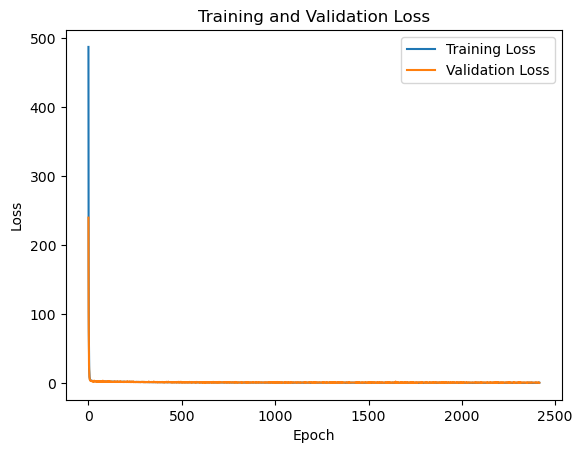

In [237]:
# Membuat plot untuk loss tiap epoch
#plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

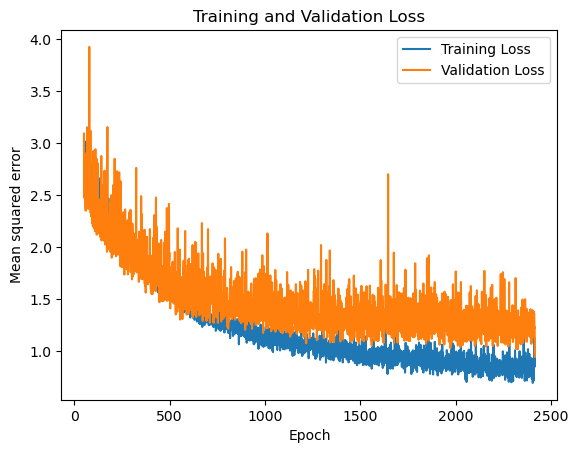

In [240]:
# Membuat plot untuk loss pada rentang epoch tertentu
start_epoch = 50
end_epoch = 2416

#plt.figure(figsize=(12, 6))
plt.plot(range(start_epoch, end_epoch + 1), history.history['loss'][start_epoch-1:end_epoch], label='Training Loss')
plt.plot(range(start_epoch, end_epoch + 1), history.history['val_loss'][start_epoch-1:end_epoch], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Mean squared error')
plt.legend()
plt.show()

In [246]:
# Mencari index epoch dengan val_loss minimum
min_val_loss_epoch = np.argmin(history.history['val_loss']) + 1  # +1 karena indeks dimulai dari 0
min_loss_epoch = np.argmin(history.history['loss']) + 1  # +1 karena indeks dimulai dari 0

# Menyimpan val_loss minimum
min_val_loss = history.history['val_loss'][min_val_loss_epoch - 1]
min_loss = history.history['loss'][min_val_loss_epoch - 1]

print(f"Epoch dengan val_loss minimum: {min_val_loss_epoch}")
print(f"Nilai val_loss minimum: {min_val_loss}")
#print(f"Epoch dengan loss minimum: {min_val_loss_epoch}")
print(f"Nilai loss minimum: {min_loss}")

Epoch dengan val_loss minimum: 2916
Nilai val_loss minimum: 0.9952991008758545
Nilai loss minimum: 0.6671373248100281


In [242]:
waktu = (end_time - start_time)/60
waktu

27.706418371200563

In [244]:
# 3 layer (97,100,97), tanh, mse, adam
model.save('ANN_Model_Data_All_raw_rev.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')

In [247]:
# Menampilkan MAE & R^2
y_pred1 = model.predict(X_val1)

maeA1 = mean_absolute_error(y_val1['α'], y_pred1[:,1])
maeB1 = mean_absolute_error(y_val1['β'], y_pred1[:,2])
maeS1 = mean_absolute_error(y_val1['V'], y_pred1[:,0])

max_errA1 = max_error(y_val1['α'], y_pred1[:,1])
max_errB1 = max_error(y_val1['β'], y_pred1[:,2])
max_errS1 = max_error(y_val1['V'], y_pred1[:,0])

# Menghitung R^2
r2_AoA1 = r2_score(y_val1['α'], y_pred1[:,1])
r2_AoS1 = r2_score(y_val1['β'], y_pred1[:,2])
r2_Speed1 = r2_score(y_val1['V'], y_pred1[:,0])

print("Mean Absolute Error (MAE) Alpha:", maeA1)
print("Max Error Alpha:", max_errA1)
print("Mean Absolute Error (MAE) Betha:", maeB1)
print("Max Error Betha:", max_errB1)
print("Mean Absolute Error (MAE) Velocity:", maeS1)
print("Max Error Velocity:", max_errS1)

print("Goodness of fit (r^2) Alpha:", r2_AoA1)
print("Goodness of fit (r^2) Betha:", r2_AoS1)
print("Goodness of fit (r^2) Velocity:", r2_Speed1)

43/43 [==============================] - 0s 1ms/step
Mean Absolute Error (MAE) Alpha: 0.18359890770029139
Max Error Alpha: 2.004230499267578
Mean Absolute Error (MAE) Betha: 0.6782922986425736
Max Error Betha: 17.876220703125
Mean Absolute Error (MAE) Velocity: 0.05063932538411455
Max Error Velocity: 3.906314204345705
Goodness of fit (r^2) Alpha: 0.9999308672610666
Goodness of fit (r^2) Betha: 0.9660941034765709
Goodness of fit (r^2) Velocity: 0.9998760437265558


In [ ]:
model = Sequential()
model.add(Dense(97, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(97, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')
    
start_time = time.time()
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=2416, batch_size=16)
end_time = time.time()

# hasil final revisi (3 layer (97,100,97), tanh, mse, adam)
43/43 [==============================] - 0s 1ms/step
Mean Absolute Error (MAE) Alpha: 0.1774517461547145
Max Error Alpha: 1.6913032531738281
Mean Absolute Error (MAE) Betha: 0.6414442299416772
Max Error Betha: 13.77781629562378
Mean Absolute Error (MAE) Velocity: 0.02458242940027321
Max Error Velocity: 0.24119874121093687
Goodness of fit (r^2) Alpha: 0.9999374418928556
Goodness of fit (r^2) Betha: 0.9736791240083925
Goodness of fit (r^2) Velocity: 0.9999939721675355

In [ ]:
# hasil akhir revisi
43/43 [==============================] - 0s 1ms/step
Mean Absolute Error (MAE) Alpha: 0.24496679133839078
Max Error Alpha: 2.8702850341796875
Mean Absolute Error (MAE) Betha: 0.8106779576562069
Max Error Betha: 13.609138488769531
Mean Absolute Error (MAE) Velocity: 0.08094408019178595
Max Error Velocity: 0.7758686577148453
Goodness of fit (r^2) Alpha: 0.9998456507746668
Goodness of fit (r^2) Betha: 0.9707921969937701
Goodness of fit (r^2) Velocity: 0.999936796954253

In [ ]:
# hasil final
43/43 [==============================] - 0s 1ms/step
Mean Absolute Error (MAE) Alpha: 0.1997239582626908
Max Error Alpha: 2.76287841796875
Mean Absolute Error (MAE) Betha: 0.5750414084174015
Max Error Betha: 8.715548515319824
Mean Absolute Error (MAE) Velocity: 0.028867758401285956
Max Error Velocity: 0.5207514361572265
Goodness of fit (r^2) Alpha: 0.9998908653363091
Goodness of fit (r^2) Betha: 0.9874825506325072
Goodness of fit (r^2) Velocity: 0.9999910782855324

In [ ]:
# hasil 2 layer (97,100), tanh, mse, adam
43/43 [==============================] - 0s 3ms/step
Mean Absolute Error (MAE) Alpha: 0.2250564647603918
Max Error Alpha: 2.917022705078125
Mean Absolute Error (MAE) Betha: 0.6280660908310501
Max Error Betha: 13.118577718734741
Mean Absolute Error (MAE) Velocity: 0.20341095931911907
Max Error Velocity: 5.052832479003907
Goodness of fit (r^2) Alpha: 0.9998855167029873
Goodness of fit (r^2) Betha: 0.9852672715561955
Goodness of fit (r^2) Velocity: 0.9992923052713428

In [ ]:
# hasil tanh, adam, mse
43/43 [==============================] - 0s 1ms/step
Mean Absolute Error (MAE) Alpha: 0.3991046286733062
Max Error Alpha: 2.5614116191864014
Mean Absolute Error (MAE) Betha: 1.124258629348543
Max Error Betha: 12.248505592346191
Mean Absolute Error (MAE) Velocity: 0.11308301248602966
Max Error Velocity: 0.46799889562988284
Goodness of fit (r^2) Alpha: 0.9997542476251844
Goodness of fit (r^2) Betha: 0.9625863266037653
Goodness of fit (r^2) Velocity: 0.9999004648535955

In [ ]:
# hasil tanh, adam, mae
43/43 [==============================] - 0s 901us/step
Mean Absolute Error (MAE) Alpha: 0.3485512018203735
Max Error Alpha: 3.239469528198242
Mean Absolute Error (MAE) Betha: 1.0770755231380462
Max Error Betha: 15.307518005371094
Mean Absolute Error (MAE) Velocity: 0.07557026644296164
Max Error Velocity: 0.5090869998779297
Goodness of fit (r^2) Alpha: 0.9997251477387412
Goodness of fit (r^2) Betha: 0.9525585354208793
Goodness of fit (r^2) Velocity: 0.9999517969383737

In [107]:
X_train1

,Pβ2,Pα1,Pβ1,Pα2,P3,ps,pt-wt,ps-wt
3377,-0.07744,0.75585,-0.74406,-0.92419,0.14814,-0.32490,0.84338,-0.00168
4865,-1.34672,0.03198,-1.50664,-1.11273,-1.27265,-0.64643,0.86527,0.01852
4725,-0.44778,0.33668,-0.63128,-0.69861,-0.36530,-0.36361,0.48145,0.01178
3770,-0.82487,-0.07744,-0.85180,-0.60602,-0.78615,-0.39055,0.48314,0.01683
1027,0.01515,0.02525,-0.00505,-0.01347,0.05892,0.00168,0.05724,0.00842
5888,0.01683,-0.14982,0.00000,0.22389,0.45452,-0.00337,0.47640,-0.00337
1966,-2.14465,0.10942,-2.27428,-1.65647,-1.95948,-0.87369,1.34167,0.02357
349,-0.06902,0.62286,-0.09932,-0.49997,0.69356,-0.08417,0.84675,-0.00337
6699,-1.11441,-1.21878,0.47472,0.91072,0.59761,-0.33836,1.31642,0.00168
662,-0.35015,0.02357,-0.36530,-0.28955,-0.31648,-0.16161,0.21379,0.00168


### RBF networks

In [38]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

# Define the RBF activation function
def rbf(x, beta=1.0):
    return tf.exp(-beta * tf.square(x))

checkpoint_callback = ModelCheckpoint(filepath='best_model_rbf.h5', save_best_only=True, monitor='val_loss', mode='min')

# Build the RBF network
model = Sequential()
model.add(Dense(200, input_dim=6, activation=rbf))  # RBF layer with 10 units
#model.add(Dense(150, input_dim=6, activation=rbf))
#model.add(Dense(100, input_dim=6, activation=rbf))
model.add(Dense(3, activation='linear'))  # Output layer

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), callbacks=[checkpoint_callback], epochs=2555, batch_size=16, verbose=1)

# Evaluate the model on the test set
#mse = model.evaluate(X_val1, y_val1, verbose=0)
#print(f'Mean Squared Error on Test Set: {mse}')

# Make predictions
predictions = model.predict(X_val1)

# Plot the results
#import matplotlib.pyplot as plt

#plt.scatter(X_val1, y_val1, label='Actual')
#plt.scatter(X_val1, predictions, label='Predicted', marker='x')
#plt.legend()
#plt.title('RBF Network Prediction')
#plt.xlabel('Input')
#plt.ylabel('Output')
#plt.show()

Epoch 1/2555
338/338 [==============================] - 2s 3ms/step - loss: 614.5159 - val_loss: 444.4482
Epoch 2/2555
338/338 [==============================] - 1s 2ms/step - loss: 392.7540 - val_loss: 319.8133
Epoch 3/2555
338/338 [==============================] - 1s 2ms/step - loss: 283.9139 - val_loss: 239.6831
Epoch 4/2555
338/338 [==============================] - 1s 2ms/step - loss: 214.9860 - val_loss: 182.6629
Epoch 5/2555
338/338 [==============================] - 1s 2ms/step - loss: 164.3394 - val_loss: 141.4283
Epoch 6/2555
338/338 [==============================] - 1s 2ms/step - loss: 130.9434 - val_loss: 117.2095
Epoch 7/2555
338/338 [==============================] - 1s 2ms/step - loss: 110.0869 - val_loss: 101.2328
Epoch 8/2555
338/338 [==============================] - 1s 2ms/step - loss: 95.4514 - val_loss: 88.9160
Epoch 9/2555
338/338 [==============================] - 1s 2ms/step - loss: 83.7310 - val_loss: 78.6153
Epoch 10/2555
338/338 [===========================

Epoch 80/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.3469 - val_loss: 5.2283
Epoch 81/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.3048 - val_loss: 5.3156
Epoch 82/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.2769 - val_loss: 5.1588
Epoch 83/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.2580 - val_loss: 5.0786
Epoch 84/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.2151 - val_loss: 5.1030
Epoch 85/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.1938 - val_loss: 5.0519
Epoch 86/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.1746 - val_loss: 4.9935
Epoch 87/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.1570 - val_loss: 4.9453
Epoch 88/2555
338/338 [==============================] - 1s 2ms/step - loss: 5.0907 - val_loss: 5.1693
Epoch 89/2555
338/338 [==============================] - 1s 2ms/step - lo

Epoch 159/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.7428 - val_loss: 3.6298
Epoch 160/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.7425 - val_loss: 3.4208
Epoch 161/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.7199 - val_loss: 3.4687
Epoch 162/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.7336 - val_loss: 3.4420
Epoch 163/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.7121 - val_loss: 3.4681
Epoch 164/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.7115 - val_loss: 3.6100
Epoch 165/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.6577 - val_loss: 3.4352
Epoch 166/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.6742 - val_loss: 3.4051
Epoch 167/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.6623 - val_loss: 3.4805
Epoch 168/2555
338/338 [==============================] - 1s 2ms

Epoch 238/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2830 - val_loss: 3.0124
Epoch 239/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2494 - val_loss: 3.1473
Epoch 240/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2796 - val_loss: 2.9875
Epoch 241/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2447 - val_loss: 3.0640
Epoch 242/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2579 - val_loss: 3.0018
Epoch 243/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2485 - val_loss: 3.0587
Epoch 244/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2609 - val_loss: 2.9880
Epoch 245/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2771 - val_loss: 3.0869
Epoch 246/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.2503 - val_loss: 3.0302
Epoch 247/2555
338/338 [==============================] - 1s 2ms

Epoch 317/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0589 - val_loss: 2.8439
Epoch 318/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0818 - val_loss: 2.8859
Epoch 319/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0808 - val_loss: 2.8979
Epoch 320/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0735 - val_loss: 2.8784
Epoch 321/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0840 - val_loss: 2.8211
Epoch 322/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0604 - val_loss: 2.9943
Epoch 323/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0773 - val_loss: 2.8685
Epoch 324/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0736 - val_loss: 2.8618
Epoch 325/2555
338/338 [==============================] - 1s 2ms/step - loss: 3.0593 - val_loss: 2.8295
Epoch 326/2555
338/338 [==============================] - 1s 2ms

Epoch 396/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9556 - val_loss: 2.7610
Epoch 397/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9598 - val_loss: 2.7835
Epoch 398/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9628 - val_loss: 2.7093
Epoch 399/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9671 - val_loss: 2.8333
Epoch 400/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9863 - val_loss: 2.8015
Epoch 401/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9778 - val_loss: 2.7308
Epoch 402/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9351 - val_loss: 2.7114
Epoch 403/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9602 - val_loss: 2.7651
Epoch 404/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9745 - val_loss: 2.7318
Epoch 405/2555
338/338 [==============================] - 1s 2ms

Epoch 475/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8923 - val_loss: 2.6522
Epoch 476/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9074 - val_loss: 2.7708
Epoch 477/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9053 - val_loss: 2.6757
Epoch 478/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8863 - val_loss: 2.7125
Epoch 479/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9120 - val_loss: 2.7190
Epoch 480/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8951 - val_loss: 2.6356
Epoch 481/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9131 - val_loss: 2.6989
Epoch 482/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8841 - val_loss: 2.6834
Epoch 483/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.9090 - val_loss: 2.7587
Epoch 484/2555
338/338 [==============================] - 1s 2ms

Epoch 554/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8458 - val_loss: 2.6959
Epoch 555/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8528 - val_loss: 2.6199
Epoch 556/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8175 - val_loss: 2.6261
Epoch 557/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8298 - val_loss: 2.6352
Epoch 558/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8095 - val_loss: 2.6258
Epoch 559/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8499 - val_loss: 2.6581
Epoch 560/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8390 - val_loss: 2.6422
Epoch 561/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8327 - val_loss: 2.6414
Epoch 562/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8206 - val_loss: 2.6340
Epoch 563/2555
338/338 [==============================] - 1s 2ms

Epoch 633/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7851 - val_loss: 2.5655
Epoch 634/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7470 - val_loss: 2.6586
Epoch 635/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7862 - val_loss: 2.6006
Epoch 636/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7753 - val_loss: 2.6744
Epoch 637/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7846 - val_loss: 2.5416
Epoch 638/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8002 - val_loss: 2.6074
Epoch 639/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.8038 - val_loss: 2.5993
Epoch 640/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7802 - val_loss: 2.6319
Epoch 641/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7778 - val_loss: 2.6408
Epoch 642/2555
338/338 [==============================] - 1s 2ms

Epoch 712/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7318 - val_loss: 2.5553
Epoch 713/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7575 - val_loss: 2.7692
Epoch 714/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7501 - val_loss: 2.5575
Epoch 715/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7752 - val_loss: 2.5359
Epoch 716/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7275 - val_loss: 2.6097
Epoch 717/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7590 - val_loss: 2.5483
Epoch 718/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7247 - val_loss: 2.5575
Epoch 719/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7808 - val_loss: 2.5770
Epoch 720/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7357 - val_loss: 2.5716
Epoch 721/2555
338/338 [==============================] - 1s 2ms

Epoch 791/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6742 - val_loss: 2.5608
Epoch 792/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7050 - val_loss: 2.4791
Epoch 793/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7163 - val_loss: 2.5097
Epoch 794/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7210 - val_loss: 2.4624
Epoch 795/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7076 - val_loss: 2.5337
Epoch 796/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7125 - val_loss: 2.5445
Epoch 797/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.7146 - val_loss: 2.5226
Epoch 798/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6765 - val_loss: 2.5206
Epoch 799/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6819 - val_loss: 2.4948
Epoch 800/2555
338/338 [==============================] - 1s 2ms

Epoch 870/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6810 - val_loss: 2.5136
Epoch 871/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6533 - val_loss: 2.5723
Epoch 872/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6698 - val_loss: 2.4311
Epoch 873/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6651 - val_loss: 2.5257
Epoch 874/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6575 - val_loss: 2.4610
Epoch 875/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6539 - val_loss: 2.4773
Epoch 876/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6475 - val_loss: 2.4652
Epoch 877/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6719 - val_loss: 2.4441
Epoch 878/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6520 - val_loss: 2.4779
Epoch 879/2555
338/338 [==============================] - 1s 2ms

Epoch 949/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6408 - val_loss: 2.4737
Epoch 950/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6571 - val_loss: 2.4899
Epoch 951/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6401 - val_loss: 2.4354
Epoch 952/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6326 - val_loss: 2.5690
Epoch 953/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6242 - val_loss: 2.4607
Epoch 954/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6467 - val_loss: 2.4589
Epoch 955/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6330 - val_loss: 2.4657
Epoch 956/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6385 - val_loss: 2.4200
Epoch 957/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.6275 - val_loss: 2.4650
Epoch 958/2555
338/338 [==============================] - 1s 2ms

338/338 [==============================] - 1s 2ms/step - loss: 2.5497 - val_loss: 2.3839
Epoch 1106/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5654 - val_loss: 2.3684
Epoch 1107/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5653 - val_loss: 2.4437
Epoch 1108/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5533 - val_loss: 2.3848
Epoch 1109/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5551 - val_loss: 2.5467
Epoch 1110/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5772 - val_loss: 2.4067
Epoch 1111/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5862 - val_loss: 2.4353
Epoch 1112/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5698 - val_loss: 2.3822
Epoch 1113/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5327 - val_loss: 2.4291
Epoch 1114/2555
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.4965 - val_loss: 2.4779
Epoch 1262/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5358 - val_loss: 2.3889
Epoch 1263/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5077 - val_loss: 2.3641
Epoch 1264/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5002 - val_loss: 2.3301
Epoch 1265/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5191 - val_loss: 2.3569
Epoch 1266/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5007 - val_loss: 2.4421
Epoch 1267/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4870 - val_loss: 2.4740
Epoch 1268/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.5082 - val_loss: 2.3382
Epoch 1269/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4973 - val_loss: 2.3809
Epoch 1270/2555
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.4613 - val_loss: 2.2607
Epoch 1418/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4595 - val_loss: 2.3657
Epoch 1419/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4545 - val_loss: 2.2962
Epoch 1420/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4807 - val_loss: 2.3597
Epoch 1421/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4611 - val_loss: 2.2851
Epoch 1422/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4681 - val_loss: 2.3282
Epoch 1423/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4774 - val_loss: 2.3397
Epoch 1424/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4989 - val_loss: 2.2769
Epoch 1425/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4645 - val_loss: 2.4505
Epoch 1426/2555
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.4063 - val_loss: 2.4137
Epoch 1574/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4288 - val_loss: 2.3804
Epoch 1575/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4119 - val_loss: 2.3426
Epoch 1576/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4017 - val_loss: 2.2344
Epoch 1577/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4066 - val_loss: 2.2951
Epoch 1578/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4126 - val_loss: 2.2562
Epoch 1579/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4018 - val_loss: 2.2101
Epoch 1580/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3999 - val_loss: 2.2566
Epoch 1581/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.4070 - val_loss: 2.2198
Epoch 1582/2555
338/338 [==============================] - 1s 2ms/step 

338/338 [==============================] - 1s 2ms/step - loss: 2.3824 - val_loss: 2.4996
Epoch 1730/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3742 - val_loss: 2.2608
Epoch 1731/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3534 - val_loss: 2.1996
Epoch 1732/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3606 - val_loss: 2.2496
Epoch 1733/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3605 - val_loss: 2.2750
Epoch 1734/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3900 - val_loss: 2.3095
Epoch 1735/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3551 - val_loss: 2.2008
Epoch 1736/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3478 - val_loss: 2.1826
Epoch 1737/2555
338/338 [==============================] - 1s 2ms/step - loss: 2.3551 - val_loss: 2.3835
Epoch 1738/2555
338/338 [==============================] - 1s 2ms/step 

PermissionError: [Errno 13] Unable to create file (unable to open file: name = 'best_model_rbf.h5', errno = 13, error message = 'Permission denied', flags = 13, o_flags = 302)

In [148]:
# Menampilkan MAE & R^2
y_pred1 = model.predict(X_val1)

maeA1 = mean_absolute_error(y_val1['α'], y_pred1[:,1])
maeB1 = mean_absolute_error(y_val1['β'], y_pred1[:,2])
maeS1 = mean_absolute_error(y_val1['V'], y_pred1[:,0])

max_errA1 = max_error(y_val1['α'], y_pred1[:,1])
max_errB1 = max_error(y_val1['β'], y_pred1[:,2])
max_errS1 = max_error(y_val1['V'], y_pred1[:,0])

# Menghitung R^2
r2_AoA1 = r2_score(y_val1['α'], y_pred1[:,1])
r2_AoS1 = r2_score(y_val1['β'], y_pred1[:,2])
r2_Speed1 = r2_score(y_val1['V'], y_pred1[:,0])

print("Mean Absolute Error (MAE) Alpha:", maeA1)
print("Max Error Alpha:", max_errA1)
print("Mean Absolute Error (MAE) Betha:", maeB1)
print("Max Error Betha:", max_errB1)
print("Mean Absolute Error (MAE) Velocity:", maeS1)
print("Max Error Velocity:", max_errS1)

print("Goodness of fit (r^2) Alpha:", r2_AoA1)
print("Goodness of fit (r^2) Betha:", r2_AoS1)
print("Goodness of fit (r^2) Velocity:", r2_Speed1)

43/43 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.19432936165067885
Max Error Alpha: 2.9695358276367188
Mean Absolute Error (MAE) Betha: 0.5832811356860178
Max Error Betha: 16.300661087036133
Mean Absolute Error (MAE) Velocity: 0.06576672550573277
Max Error Velocity: 1.0646885270996123
Goodness of fit (r^2) Alpha: 0.9999110951835984
Goodness of fit (r^2) Betha: 0.9783590428281874
Goodness of fit (r^2) Velocity: 0.9999559132998666


In [146]:
# Mencari index epoch dengan val_loss minimum
min_val_loss_epoch = np.argmin(history.history['val_loss']) + 1  # +1 karena indeks dimulai dari 0

# Menyimpan val_loss minimum
min_val_loss = history.history['val_loss'][min_val_loss_epoch - 1]

print(f"Epoch dengan val_loss minimum: {min_val_loss_epoch}")
print(f"Nilai val_loss minimum: {min_val_loss}")

Epoch dengan val_loss minimum: 2555
Nilai val_loss minimum: 0.7976850271224976


In [149]:
# neuron 3 layer (100,150,100), epoch 2555
model.save('ANN_Model_Data_All_raw_rbf_3.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')

In [ ]:
43/43 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.19432936165067885
Max Error Alpha: 2.9695358276367188
Mean Absolute Error (MAE) Betha: 0.5832811356860178
Max Error Betha: 16.300661087036133
Mean Absolute Error (MAE) Velocity: 0.06576672550573277
Max Error Velocity: 1.0646885270996123
Goodness of fit (r^2) Alpha: 0.9999110951835984
Goodness of fit (r^2) Betha: 0.9783590428281874
Goodness of fit (r^2) Velocity: 0.9999559132998666

In [143]:
# neuron 2 layer (100,150), epoch 2907
model.save('ANN_Model_Data_All_raw_rbf_2.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')

In [ ]:
43/43 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.24720937333725118
Max Error Alpha: 2.637981414794922
Mean Absolute Error (MAE) Betha: 0.7444436106416914
Max Error Betha: 16.650506734848022
Mean Absolute Error (MAE) Velocity: 0.08946212649169918
Max Error Velocity: 0.8589215402832053
Goodness of fit (r^2) Alpha: 0.9998699111891606
Goodness of fit (r^2) Betha: 0.9725426122655894
Goodness of fit (r^2) Velocity: 0.9999231416079164

In [137]:
# neuron 500 1 layer
model.save('ANN_Model_Data_All_raw_rbf.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')

In [ ]:
43/43 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.3513533658451504
Max Error Alpha: 4.442909240722656
Mean Absolute Error (MAE) Betha: 1.149311232412303
Max Error Betha: 13.724747657775879
Mean Absolute Error (MAE) Velocity: 0.08442047045184103
Max Error Velocity: 0.5574532280273417
Goodness of fit (r^2) Alpha: 0.9997190947471996
Goodness of fit (r^2) Betha: 0.9513967233245925
Goodness of fit (r^2) Velocity: 0.9999416435239227

### Model development for range -30 < alpha <30

In [211]:
Data_All_Avg = pd.read_csv('Data_All_rev.csv').drop(columns=['ps','pt-wt','ps-wt'])
Data_All_Avg

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
0,0.00842,0.00000,0.00337,0.00842,0.05892,10.011648,0,0
1,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
2,0.00842,0.00337,0.00505,0.00842,0.05892,10.011648,0,0
3,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
4,0.01178,0.00337,0.00337,0.00842,0.05724,10.011648,0,0
5,0.00673,0.00168,0.00168,0.00673,0.05555,10.011648,0,0
6,0.00842,0.00505,0.00505,0.00842,0.05892,10.011648,0,0
7,0.00842,0.00505,0.00673,0.00842,0.05724,10.011648,0,0
8,0.00842,0.00337,0.00673,0.00842,0.05892,10.011648,0,0
9,0.00842,0.00168,0.00337,0.00842,0.05724,10.011648,0,0


In [212]:
Data_30_30 = Data_All_Avg[Data_All_Avg['α'] <= 30]
Data_30_30

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
0,0.00842,0.00000,0.00337,0.00842,0.05892,10.011648,0,0
1,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
2,0.00842,0.00337,0.00505,0.00842,0.05892,10.011648,0,0
3,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
4,0.01178,0.00337,0.00337,0.00842,0.05724,10.011648,0,0
5,0.00673,0.00168,0.00168,0.00673,0.05555,10.011648,0,0
6,0.00842,0.00505,0.00505,0.00842,0.05892,10.011648,0,0
7,0.00842,0.00505,0.00673,0.00842,0.05724,10.011648,0,0
8,0.00842,0.00337,0.00673,0.00842,0.05892,10.011648,0,0
9,0.00842,0.00168,0.00337,0.00842,0.05724,10.011648,0,0


In [213]:
# Pembagian data train
X_train1, X_val1, y_train1, y_val1 = train_test_split(Data_30_30.drop(columns=['V','α','β'], axis=1),
                                                  Data_30_30[['V','α','β']],
                                                  test_size=0.2, random_state=42)

X_train1

,Pβ2,Pα1,Pβ1,Pα2,P3
222,0.01347,0.19864,0.00168,-0.13131,0.46462
2421,0.50670,0.50839,-0.48650,-0.48314,1.18848
4438,0.78446,0.55047,-0.92755,-0.82318,0.89725
2423,0.50670,0.50839,-0.48819,-0.48314,1.18848
3243,0.17676,0.31311,-0.27439,-0.31143,0.31480
2449,0.29460,0.92924,-0.56394,-0.91409,0.96291
1257,-0.00505,0.41243,-0.16666,-0.34173,0.31480
5703,-0.02357,-0.04714,-0.02188,0.04882,0.01852
6139,-0.10100,-0.15824,0.01347,0.18181,0.12962
6560,-0.33163,-0.34846,0.23736,0.28113,0.27944


In [218]:
X_train1.to_csv('X_train1_3030_raw.csv', index=False)
y_train1.to_csv('y_train1_3030_raw.csv', index=False)
X_val1.to_csv('X_val1_3030_raw.csv', index=False)
y_val1.to_csv('y_val1_3030_raw.csv', index=False)
Data_train_3030_raw = pd.concat([X_train1,y_train1],axis=1)
Data_train_3030_raw.to_csv('Data_train_3030_raw.csv', index=False)
Data_train_3030_raw

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
222,0.01347,0.19864,0.00168,-0.13131,0.46462,30.030734,10,0
2421,0.50670,0.50839,-0.48650,-0.48314,1.18848,50.049495,10,-10
4438,0.78446,0.55047,-0.92755,-0.82318,0.89725,50.057390,15,-20
2423,0.50670,0.50839,-0.48819,-0.48314,1.18848,50.049495,10,-10
3243,0.17676,0.31311,-0.27439,-0.31143,0.31480,30.063097,20,-15
2449,0.29460,0.92924,-0.56394,-0.91409,0.96291,49.988281,20,-10
1257,-0.00505,0.41243,-0.16666,-0.34173,0.31480,30.006377,25,-5
5703,-0.02357,-0.04714,-0.02188,0.04882,0.01852,10.106054,-30,0
6139,-0.10100,-0.15824,0.01347,0.18181,0.12962,20.092722,-25,10
6560,-0.33163,-0.34846,0.23736,0.28113,0.27944,30.046311,-20,20


In [169]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

losses1_val=[]
losses1=[]

model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')
    
start_time = time.time()
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=2972, batch_size=16)
end_time = time.time()
loss = history.history['loss'][-1]
loss_val = history.history['val_loss'][-1]
losses1.append(loss)
losses1_val.append(loss_val)

Epoch 1/2972
175/175 [==============================] - 2s 4ms/step - loss: 258.8513 - val_loss: 146.8437
Epoch 2/2972
175/175 [==============================] - 0s 2ms/step - loss: 98.6077 - val_loss: 63.6233
Epoch 3/2972
175/175 [==============================] - 1s 3ms/step - loss: 45.7907 - val_loss: 31.3888
Epoch 4/2972
175/175 [==============================] - 0s 2ms/step - loss: 25.5914 - val_loss: 20.0247
Epoch 5/2972
175/175 [==============================] - 0s 2ms/step - loss: 16.4314 - val_loss: 12.1860
Epoch 6/2972
175/175 [==============================] - 0s 2ms/step - loss: 9.8924 - val_loss: 7.5369
Epoch 7/2972
175/175 [==============================] - 0s 2ms/step - loss: 6.1080 - val_loss: 4.5952
Epoch 8/2972
175/175 [==============================] - 0s 2ms/step - loss: 3.8349 - val_loss: 2.9621
Epoch 9/2972
175/175 [==============================] - 0s 2ms/step - loss: 2.5266 - val_loss: 2.1589
Epoch 10/2972
175/175 [==============================] - 0s 2ms/step -

175/175 [==============================] - 0s 2ms/step - loss: 0.0900 - val_loss: 0.0767
Epoch 160/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0718
Epoch 161/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0908 - val_loss: 0.1029
Epoch 162/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0781 - val_loss: 0.0759
Epoch 163/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0892 - val_loss: 0.0766
Epoch 164/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0732 - val_loss: 0.0609
Epoch 165/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0730 - val_loss: 0.0973
Epoch 166/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0813 - val_loss: 0.0921
Epoch 167/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0819 - val_loss: 0.0897
Epoch 168/2972
175/175 [==============================] - 0s 2ms/step - loss: 0

Epoch 238/2972
175/175 [==============================] - 0s 3ms/step - loss: 0.0915 - val_loss: 0.1126
Epoch 239/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0687 - val_loss: 0.0565
Epoch 240/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0669 - val_loss: 0.0574
Epoch 241/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0648 - val_loss: 0.0732
Epoch 242/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0643 - val_loss: 0.0601
Epoch 243/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0627 - val_loss: 0.0591
Epoch 244/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0673 - val_loss: 0.0824
Epoch 245/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0590 - val_loss: 0.0603
Epoch 246/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0665 - val_loss: 0.1493
Epoch 247/2972
175/175 [==============================] - 0s 2ms

Epoch 317/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0583 - val_loss: 0.0423
Epoch 318/2972
175/175 [==============================] - 0s 3ms/step - loss: 0.0531 - val_loss: 0.0427
Epoch 319/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0531 - val_loss: 0.0621
Epoch 320/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0546 - val_loss: 0.0472
Epoch 321/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0547 - val_loss: 0.0550
Epoch 322/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0499 - val_loss: 0.0470
Epoch 323/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0615 - val_loss: 0.0612
Epoch 324/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0569 - val_loss: 0.0398
Epoch 325/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0518 - val_loss: 0.0530
Epoch 326/2972
175/175 [==============================] - 0s 2ms

Epoch 396/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0447 - val_loss: 0.0555
Epoch 397/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0446 - val_loss: 0.0485
Epoch 398/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0456 - val_loss: 0.0421
Epoch 399/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0440 - val_loss: 0.0391
Epoch 400/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0496 - val_loss: 0.0346
Epoch 401/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0465 - val_loss: 0.0543
Epoch 402/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0457 - val_loss: 0.0507
Epoch 403/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0409 - val_loss: 0.0553
Epoch 404/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0432 - val_loss: 0.0639
Epoch 405/2972
175/175 [==============================] - 0s 2ms

Epoch 475/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0452 - val_loss: 0.0449
Epoch 476/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0395 - val_loss: 0.0384
Epoch 477/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0560 - val_loss: 0.0484
Epoch 478/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0394 - val_loss: 0.0430
Epoch 479/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0439 - val_loss: 0.0492
Epoch 480/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0367 - val_loss: 0.0497
Epoch 481/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0384 - val_loss: 0.0419
Epoch 482/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0395 - val_loss: 0.0352
Epoch 483/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0414 - val_loss: 0.0444
Epoch 484/2972
175/175 [==============================] - 0s 2ms

Epoch 554/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0400 - val_loss: 0.0368
Epoch 555/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0382 - val_loss: 0.0471
Epoch 556/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0384
Epoch 557/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0331 - val_loss: 0.0393
Epoch 558/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0422 - val_loss: 0.0572
Epoch 559/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0370 - val_loss: 0.0468
Epoch 560/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0318 - val_loss: 0.0319
Epoch 561/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0310 - val_loss: 0.0350
Epoch 562/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0328 - val_loss: 0.0460
Epoch 563/2972
175/175 [==============================] - 0s 2ms

Epoch 633/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0360 - val_loss: 0.0373
Epoch 634/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0345 - val_loss: 0.0359
Epoch 635/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0335 - val_loss: 0.0342
Epoch 636/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0312 - val_loss: 0.0320
Epoch 637/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0340 - val_loss: 0.0550
Epoch 638/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0504 - val_loss: 0.0412
Epoch 639/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.0275
Epoch 640/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0333
Epoch 641/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0305 - val_loss: 0.0969
Epoch 642/2972
175/175 [==============================] - 0s 2ms

Epoch 712/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0327 - val_loss: 0.0470
Epoch 713/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0283 - val_loss: 0.0254
Epoch 714/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.0281
Epoch 715/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0324
Epoch 716/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0259 - val_loss: 0.0290
Epoch 717/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.0366
Epoch 718/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0267
Epoch 719/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0286 - val_loss: 0.0300
Epoch 720/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0279 - val_loss: 0.0317
Epoch 721/2972
175/175 [==============================] - 0s 2ms

Epoch 791/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0289
Epoch 792/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0283
Epoch 793/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0416
Epoch 794/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0264 - val_loss: 0.0403
Epoch 795/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0255
Epoch 796/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0375 - val_loss: 0.0420
Epoch 797/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.0472
Epoch 798/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0254
Epoch 799/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0262
Epoch 800/2972
175/175 [==============================] - 0s 2ms

Epoch 870/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0322 - val_loss: 0.0321
Epoch 871/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0268
Epoch 872/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0253
Epoch 873/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0295
Epoch 874/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0307
Epoch 875/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0283
Epoch 876/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0263
Epoch 877/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0276 - val_loss: 0.0287
Epoch 878/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0240
Epoch 879/2972
175/175 [==============================] - 0s 2ms

Epoch 949/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0398
Epoch 950/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0226 - val_loss: 0.0478
Epoch 951/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0462
Epoch 952/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0219
Epoch 953/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0331
Epoch 954/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0238
Epoch 955/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0246
Epoch 956/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0279
Epoch 957/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0253
Epoch 958/2972
175/175 [==============================] - 0s 2ms

175/175 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0250
Epoch 1106/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0264
Epoch 1107/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0194
Epoch 1108/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0211
Epoch 1109/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0274
Epoch 1110/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0226
Epoch 1111/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0301
Epoch 1112/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0255
Epoch 1113/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0168
Epoch 1114/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0158
Epoch 1262/2972
175/175 [==============================] - 1s 3ms/step - loss: 0.0100 - val_loss: 0.0143
Epoch 1263/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0122
Epoch 1264/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0145
Epoch 1265/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0140
Epoch 1266/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0300
Epoch 1267/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0130
Epoch 1268/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0138
Epoch 1269/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0154
Epoch 1270/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0133
Epoch 1418/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0102
Epoch 1419/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0101
Epoch 1420/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0152
Epoch 1421/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0100
Epoch 1422/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0115
Epoch 1423/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0109
Epoch 1424/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0188
Epoch 1425/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0175
Epoch 1426/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0097
Epoch 1574/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0095
Epoch 1575/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0083
Epoch 1576/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0096
Epoch 1577/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0310
Epoch 1578/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0069
Epoch 1579/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0074
Epoch 1580/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0080
Epoch 1581/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0104
Epoch 1582/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0070
Epoch 1730/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0083
Epoch 1731/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0074
Epoch 1732/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0091
Epoch 1733/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0066
Epoch 1734/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0079
Epoch 1735/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0093
Epoch 1736/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0075
Epoch 1737/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0106
Epoch 1738/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0179
Epoch 1886/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0051
Epoch 1887/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0061
Epoch 1888/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0061
Epoch 1889/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0057
Epoch 1890/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0090
Epoch 1891/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0053 - val_loss: 0.0070
Epoch 1892/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0453
Epoch 1893/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0075
Epoch 1894/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0063
Epoch 2042/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0072
Epoch 2043/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0064
Epoch 2044/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0072
Epoch 2045/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0065
Epoch 2046/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0086
Epoch 2047/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.1257
Epoch 2048/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0509 - val_loss: 0.0095
Epoch 2049/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0043
Epoch 2050/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0055
Epoch 2198/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0042
Epoch 2199/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0038
Epoch 2200/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0034
Epoch 2201/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0037
Epoch 2202/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0050
Epoch 2203/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0063
Epoch 2204/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0044
Epoch 2205/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0062
Epoch 2206/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0041
Epoch 2354/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0061
Epoch 2355/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0053
Epoch 2356/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0059
Epoch 2357/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0061
Epoch 2358/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0058
Epoch 2359/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0041
Epoch 2360/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0041
Epoch 2361/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0725
Epoch 2362/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0045
Epoch 2510/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0041
Epoch 2511/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0052
Epoch 2512/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0062
Epoch 2513/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.3094
Epoch 2514/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0587 - val_loss: 0.0086
Epoch 2515/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0042
Epoch 2516/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0029
Epoch 2517/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 2518/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0039
Epoch 2666/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0032
Epoch 2667/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0037
Epoch 2668/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0068
Epoch 2669/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0039
Epoch 2670/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 2671/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0034
Epoch 2672/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0037
Epoch 2673/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0043
Epoch 2674/2972
175/175 [==============================] - 0s 2ms/step 

175/175 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0033
Epoch 2822/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0048
Epoch 2823/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.1994
Epoch 2824/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0063
Epoch 2825/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0030
Epoch 2826/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0013 - val_loss: 0.0027
Epoch 2827/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 2828/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0028
Epoch 2829/2972
175/175 [==============================] - 0s 2ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 2830/2972
175/175 [==============================] - 0s 2ms/step 

In [168]:
# Mencari index epoch dengan val_loss minimum
min_val_loss_epoch = np.argmin(history.history['val_loss']) + 1  # +1 karena indeks dimulai dari 0

# Menyimpan val_loss minimum
min_val_loss = history.history['val_loss'][min_val_loss_epoch - 1]

print(f"Epoch dengan val_loss minimum: {min_val_loss_epoch}")
print(f"Nilai val_loss minimum: {min_val_loss}")

Epoch dengan val_loss minimum: 2972
Nilai val_loss minimum: 0.0018416416132822633


model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2964
Nilai val_loss minimum: 0.1292082667350769

-----------------------------------------------------------------------------------------------
model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2797
Nilai val_loss minimum: 0.03395773842930794


In [170]:
# Menampilkan MAE & R^2
y_pred1 = model.predict(X_val1)

maeA1 = mean_absolute_error(y_val1['α'], y_pred1[:,1])
maeB1 = mean_absolute_error(y_val1['β'], y_pred1[:,2])
maeS1 = mean_absolute_error(y_val1['V'], y_pred1[:,0])

max_errA1 = max_error(y_val1['α'], y_pred1[:,1])
max_errB1 = max_error(y_val1['β'], y_pred1[:,2])
max_errS1 = max_error(y_val1['V'], y_pred1[:,0])

# Menghitung R^2
r2_AoA1 = r2_score(y_val1['α'], y_pred1[:,1])
r2_AoS1 = r2_score(y_val1['β'], y_pred1[:,2])
r2_Speed1 = r2_score(y_val1['V'], y_pred1[:,0])

print("Mean Absolute Error (MAE) Alpha:", maeA1)
print("Max Error Alpha:", max_errA1)
print("Mean Absolute Error (MAE) Betha:", maeB1)
print("Max Error Betha:", max_errB1)
print("Mean Absolute Error (MAE) Velocity:", maeS1)
print("Max Error Velocity:", max_errS1)

print("Goodness of fit (r^2) Alpha:", r2_AoA1)
print("Goodness of fit (r^2) Betha:", r2_AoS1)
print("Goodness of fit (r^2) Velocity:", r2_Speed1)

22/22 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.02632531370435442
Max Error Alpha: 0.5710654258728027
Mean Absolute Error (MAE) Betha: 0.023081614904637848
Max Error Betha: 0.5084505081176758
Mean Absolute Error (MAE) Velocity: 0.021155044164167202
Max Error Velocity: 0.1744883165283202
Goodness of fit (r^2) Alpha: 0.9999907047278689
Goodness of fit (r^2) Betha: 0.9999902972411104
Goodness of fit (r^2) Velocity: 0.9999948742712096


In [12]:
# 3 Hidden layer (100,95,100), epoch 2972
model.save('ANN_Model_Data_All_raw_3030.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')

In [13]:
model = tf.keras.models.load_model('ANN_Model_Data_All_raw_3030.h5')
X_train1 = pd.read_csv('X_train1_3030_raw.csv')
y_train1 = pd.read_csv('y_train1_3030_raw.csv')
# Menampilkan MAE & R^2
y_pred1 = model.predict(X_train1)

maeA1 = mean_absolute_error(y_train1['α'], y_pred1[:,1])
maeB1 = mean_absolute_error(y_train1['β'], y_pred1[:,2])
maeS1 = mean_absolute_error(y_train1['V'], y_pred1[:,0])

max_errA1 = max_error(y_train1['α'], y_pred1[:,1])
max_errB1 = max_error(y_train1['β'], y_pred1[:,2])
max_errS1 = max_error(y_train1['V'], y_pred1[:,0])

# Menghitung R^2
r2_AoA1 = r2_score(y_train1['α'], y_pred1[:,1])
r2_AoS1 = r2_score(y_train1['β'], y_pred1[:,2])
r2_Speed1 = r2_score(y_train1['V'], y_pred1[:,0])

print("Mean Absolute Error (MAE) Alpha:", maeA1)
print("Max Error Alpha:", max_errA1)
print("Mean Absolute Error (MAE) Betha:", maeB1)
print("Max Error Betha:", max_errB1)
print("Mean Absolute Error (MAE) Velocity:", maeS1)
print("Max Error Velocity:", max_errS1)

print("Goodness of fit (r^2) Alpha:", r2_AoA1)
print("Goodness of fit (r^2) Betha:", r2_AoS1)
print("Goodness of fit (r^2) Velocity:", r2_Speed1)

88/88 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.01869536946394614
Max Error Alpha: 0.3953218460083008
Mean Absolute Error (MAE) Betha: 0.01935727755406073
Max Error Betha: 0.1800365447998047
Mean Absolute Error (MAE) Velocity: 0.016088098558981717
Max Error Velocity: 0.20946909045410145
Goodness of fit (r^2) Alpha: 0.9999971112516162
Goodness of fit (r^2) Betha: 0.9999953815354282
Goodness of fit (r^2) Velocity: 0.999997261027173


### Model development for range 30 < alpha <60

In [3]:
Data_All_Avg = pd.read_csv('Data_All_rev.csv').drop(columns=['ps','pt-wt','ps-wt'])
Data_All_Avg

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
0,0.00842,0.00000,0.00337,0.00842,0.05892,10.011648,0,0
1,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
2,0.00842,0.00337,0.00505,0.00842,0.05892,10.011648,0,0
3,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
4,0.01178,0.00337,0.00337,0.00842,0.05724,10.011648,0,0
...,...,...,...,...,...,...,...,...
6745,-0.80803,-0.15319,0.96291,-0.12626,1.07569,50.038935,0,20
6746,-0.81477,-0.15992,0.96122,-0.12962,1.07233,50.038935,0,20
6747,-0.80803,-0.15824,0.96122,-0.12962,1.07233,50.038935,0,20
6748,-0.80972,-0.15656,0.96291,-0.12457,1.07401,50.038935,0,20


In [4]:
Data_30_60 = Data_All_Avg[(Data_All_Avg['α'] <= 60) & (Data_All_Avg['α'] >= 30)]
Data_30_60

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
60,-0.01683,0.05219,-0.02020,-0.04882,0.02020,10.02466,30,0
61,-0.01683,0.05219,-0.02188,-0.04882,0.02020,10.02466,30,0
62,-0.01852,0.04882,-0.02357,-0.04714,0.02188,10.02466,30,0
63,-0.01683,0.05050,-0.02188,-0.04714,0.02020,10.02466,30,0
64,-0.01515,0.05219,-0.02020,-0.04714,0.02188,10.02466,30,0
...,...,...,...,...,...,...,...,...
4935,-1.34672,0.77100,-1.71539,-1.34167,-1.14640,50.03173,60,-20
4936,-1.33830,0.77268,-1.67667,-1.38881,-1.14808,50.03173,60,-20
4937,-1.34504,0.77100,-1.70865,-1.33830,-1.14640,50.03173,60,-20
4938,-1.35009,0.77268,-1.67330,-1.31810,-1.13630,50.03173,60,-20


In [5]:
# Pembagian data train
X_train1, X_val1, y_train1, y_val1 = train_test_split(Data_30_60.drop(columns=['V','α','β'], axis=1),
                                                  Data_30_60[['V','α','β']],
                                                  test_size=0.2, random_state=42)

X_train1

,Pβ2,Pα1,Pβ1,Pα2,P3
2468,-0.06565,1.18680,-0.77605,-1.29622,0.56562
600,-0.14982,0.20537,-0.16161,-0.25756,-0.02525
2079,-0.01515,0.05219,-0.04040,-0.05724,0.00337
1712,-0.42590,0.43600,-0.47809,-0.66326,-0.20032
1080,-0.02357,0.05724,-0.03872,-0.06060,0.00337
...,...,...,...,...,...
2810,-0.69524,0.75585,-0.92924,-1.25245,-0.37203
3274,-0.03535,0.42927,-0.41580,-0.49829,0.08080
2180,-0.08080,0.20369,-0.18181,-0.24746,-0.00337
3619,-0.15992,0.18012,-0.23904,-0.28281,-0.09764


In [6]:
X_train1.to_csv('X_train1_3060_raw.csv', index=False)
y_train1.to_csv('y_train1_3060_raw.csv', index=False)
X_val1.to_csv('X_val1_3060_raw.csv', index=False)
y_val1.to_csv('y_val1_3060_raw.csv', index=False)
Data_train_3060_raw = pd.concat([X_train1,y_train1],axis=1)
Data_train_3060_raw.to_csv('Data_train_3060_raw.csv', index=False)
Data_train_3060_raw

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
2468,-0.06565,1.18680,-0.77605,-1.29622,0.56562,49.995243,30,-10
600,-0.14982,0.20537,-0.16161,-0.25756,-0.02525,20.019538,45,0
2079,-0.01515,0.05219,-0.04040,-0.05724,0.00337,10.216354,35,-10
1712,-0.42590,0.43600,-0.47809,-0.66326,-0.20032,29.970208,50,-5
1080,-0.02357,0.05724,-0.03872,-0.06060,0.00337,10.025026,40,-5
...,...,...,...,...,...,...,...,...
2810,-0.69524,0.75585,-0.92924,-1.25245,-0.37203,39.970140,50,-10
3274,-0.03535,0.42927,-0.41580,-0.49829,0.08080,29.990504,35,-15
2180,-0.08080,0.20369,-0.18181,-0.24746,-0.00337,20.008334,40,-10
3619,-0.15992,0.18012,-0.23904,-0.28281,-0.09764,19.998682,50,-15


In [183]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

losses1_val=[]
losses1=[]

model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')
    
start_time = time.time()
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=1748, batch_size=16)
end_time = time.time()
loss = history.history['loss'][-1]
loss_val = history.history['val_loss'][-1]
losses1.append(loss)
losses1_val.append(loss_val)

Epoch 1/1748
100/100 [==============================] - 1s 5ms/step - loss: 669.5536 - val_loss: 469.6979
Epoch 2/1748
100/100 [==============================] - 0s 3ms/step - loss: 346.4208 - val_loss: 277.5028
Epoch 3/1748
100/100 [==============================] - 0s 3ms/step - loss: 214.2262 - val_loss: 185.3619
Epoch 4/1748
100/100 [==============================] - 0s 3ms/step - loss: 153.1772 - val_loss: 142.2643
Epoch 5/1748
100/100 [==============================] - 0s 3ms/step - loss: 115.7565 - val_loss: 104.6579
Epoch 6/1748
100/100 [==============================] - 0s 3ms/step - loss: 86.7896 - val_loss: 84.4636
Epoch 7/1748
100/100 [==============================] - 0s 3ms/step - loss: 72.6579 - val_loss: 73.1698
Epoch 8/1748
100/100 [==============================] - 0s 3ms/step - loss: 63.7454 - val_loss: 65.4165
Epoch 9/1748
100/100 [==============================] - 0s 2ms/step - loss: 57.9435 - val_loss: 60.6209
Epoch 10/1748
100/100 [==============================]

Epoch 80/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.7164 - val_loss: 0.6290
Epoch 81/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.7351 - val_loss: 0.6652
Epoch 82/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.6833 - val_loss: 1.4386
Epoch 83/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.7353 - val_loss: 0.8245
Epoch 84/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.6500 - val_loss: 0.9046
Epoch 85/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.7104 - val_loss: 1.1812
Epoch 86/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.6631 - val_loss: 0.6253
Epoch 87/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.6014 - val_loss: 0.8110
Epoch 88/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.6418 - val_loss: 0.6692
Epoch 89/1748
100/100 [==============================] - 0s 2ms/step - lo

Epoch 159/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.3578 - val_loss: 0.4089
Epoch 160/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.5046 - val_loss: 0.4029
Epoch 161/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.4031 - val_loss: 0.3818
Epoch 162/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.4224 - val_loss: 0.3573
Epoch 163/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.4323 - val_loss: 0.3951
Epoch 164/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.4126 - val_loss: 0.3977
Epoch 165/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.4376 - val_loss: 0.4126
Epoch 166/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.4281 - val_loss: 0.3707
Epoch 167/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.4515 - val_loss: 0.7652
Epoch 168/1748
100/100 [==============================] - 0s 2ms

Epoch 238/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.2570 - val_loss: 0.3153
Epoch 239/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.2492 - val_loss: 0.2539
Epoch 240/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2177 - val_loss: 0.3429
Epoch 241/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2356 - val_loss: 0.2349
Epoch 242/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2669 - val_loss: 0.2689
Epoch 243/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2765 - val_loss: 0.5519
Epoch 244/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2733 - val_loss: 0.1938
Epoch 245/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2249 - val_loss: 0.2317
Epoch 246/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.3257 - val_loss: 0.3536
Epoch 247/1748
100/100 [==============================] - 0s 2ms

Epoch 317/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1512 - val_loss: 0.1576
Epoch 318/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1861 - val_loss: 0.2403
Epoch 319/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1796 - val_loss: 0.2636
Epoch 320/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1564 - val_loss: 0.1636
Epoch 321/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1947 - val_loss: 0.2569
Epoch 322/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1760 - val_loss: 0.2231
Epoch 323/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2032 - val_loss: 0.2434
Epoch 324/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1720 - val_loss: 0.1600
Epoch 325/1748
100/100 [==============================] - 0s 5ms/step - loss: 0.1449 - val_loss: 0.1457
Epoch 326/1748
100/100 [==============================] - 0s 2ms

Epoch 396/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1205 - val_loss: 0.1254
Epoch 397/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1434 - val_loss: 0.1700
Epoch 398/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1646 - val_loss: 0.1324
Epoch 399/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1091 - val_loss: 0.1277
Epoch 400/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0972 - val_loss: 0.1040
Epoch 401/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1477 - val_loss: 0.2781
Epoch 402/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.2472 - val_loss: 0.1357
Epoch 403/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.3615 - val_loss: 0.6525
Epoch 404/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1399 - val_loss: 0.1263
Epoch 405/1748
100/100 [==============================] - 0s 3ms

Epoch 475/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1473 - val_loss: 0.1774
Epoch 476/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1845 - val_loss: 0.1470
Epoch 477/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2824 - val_loss: 0.2322
Epoch 478/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0898 - val_loss: 0.1149
Epoch 479/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0679 - val_loss: 0.0662
Epoch 480/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0717 - val_loss: 0.1196
Epoch 481/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0583 - val_loss: 0.0740
Epoch 482/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0709 - val_loss: 0.0733
Epoch 483/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1043 - val_loss: 0.2129
Epoch 484/1748
100/100 [==============================] - 0s 3ms

Epoch 554/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1062 - val_loss: 0.1027
Epoch 555/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.3289 - val_loss: 0.2632
Epoch 556/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0931 - val_loss: 0.1087
Epoch 557/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0622 - val_loss: 0.0926
Epoch 558/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0725 - val_loss: 0.0482
Epoch 559/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1108 - val_loss: 0.1017
Epoch 560/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0510 - val_loss: 0.0883
Epoch 561/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0671 - val_loss: 0.0794
Epoch 562/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0415 - val_loss: 0.0843
Epoch 563/1748
100/100 [==============================] - 0s 2ms

Epoch 633/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1208 - val_loss: 0.0732
Epoch 634/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0931 - val_loss: 0.1229
Epoch 635/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2188 - val_loss: 0.0894
Epoch 636/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0523 - val_loss: 0.0996
Epoch 637/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0417 - val_loss: 0.0446
Epoch 638/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0735 - val_loss: 0.0526
Epoch 639/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1004 - val_loss: 0.0844
Epoch 640/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0484 - val_loss: 0.0684
Epoch 641/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0543 - val_loss: 0.0903
Epoch 642/1748
100/100 [==============================] - 0s 2ms

Epoch 712/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0581 - val_loss: 0.0538
Epoch 713/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0399 - val_loss: 0.0453
Epoch 714/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2334 - val_loss: 0.3550
Epoch 715/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2287 - val_loss: 0.0951
Epoch 716/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0785 - val_loss: 0.0462
Epoch 717/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0261
Epoch 718/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0354 - val_loss: 0.1818
Epoch 719/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.3851 - val_loss: 0.1920
Epoch 720/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0523 - val_loss: 0.0611
Epoch 721/1748
100/100 [==============================] - 0s 2ms

Epoch 791/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0404 - val_loss: 0.0284
Epoch 792/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0517
Epoch 793/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1741 - val_loss: 0.0892
Epoch 794/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0335 - val_loss: 0.1405
Epoch 795/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0558 - val_loss: 0.1031
Epoch 796/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0494 - val_loss: 0.0559
Epoch 797/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0847 - val_loss: 0.0547
Epoch 798/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0544 - val_loss: 0.0348
Epoch 799/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0932
Epoch 800/1748
100/100 [==============================] - 0s 2ms

Epoch 870/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0220 - val_loss: 0.0507
Epoch 871/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0580 - val_loss: 0.2527
Epoch 872/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2415 - val_loss: 0.4380
Epoch 873/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0432 - val_loss: 0.0332
Epoch 874/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0359
Epoch 875/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0420 - val_loss: 0.0648
Epoch 876/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0420 - val_loss: 0.0758
Epoch 877/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1292 - val_loss: 0.2336
Epoch 878/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.2528 - val_loss: 0.1629
Epoch 879/1748
100/100 [==============================] - 0s 2ms

Epoch 949/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0503 - val_loss: 0.0743
Epoch 950/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0536 - val_loss: 0.3285
Epoch 951/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0994 - val_loss: 0.0517
Epoch 952/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0478
Epoch 953/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0396 - val_loss: 0.0455
Epoch 954/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1170 - val_loss: 0.0536
Epoch 955/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0658
Epoch 956/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0850 - val_loss: 0.0549
Epoch 957/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0887 - val_loss: 0.0640
Epoch 958/1748
100/100 [==============================] - 0s 2ms

100/100 [==============================] - 0s 2ms/step - loss: 0.0348 - val_loss: 0.0373
Epoch 1106/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0357 - val_loss: 0.0299
Epoch 1107/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0399 - val_loss: 0.0326
Epoch 1108/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0400
Epoch 1109/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1726 - val_loss: 0.1251
Epoch 1110/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0675 - val_loss: 0.1078
Epoch 1111/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.1067
Epoch 1112/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0291
Epoch 1113/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.1069
Epoch 1114/1748
100/100 [==============================] - 0s 2ms/step 

100/100 [==============================] - 0s 2ms/step - loss: 0.0760 - val_loss: 0.0384
Epoch 1262/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0586 - val_loss: 0.0649
Epoch 1263/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0847 - val_loss: 0.0350
Epoch 1264/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0127
Epoch 1265/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0315 - val_loss: 0.1993
Epoch 1266/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0539 - val_loss: 0.0623
Epoch 1267/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0299 - val_loss: 0.0570
Epoch 1268/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1182 - val_loss: 0.0503
Epoch 1269/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0236 - val_loss: 0.0741
Epoch 1270/1748
100/100 [==============================] - 0s 2ms/step 

100/100 [==============================] - 0s 2ms/step - loss: 0.0858 - val_loss: 0.1506
Epoch 1418/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0168
Epoch 1419/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0125
Epoch 1420/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0078
Epoch 1421/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0569
Epoch 1422/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0709 - val_loss: 0.0149
Epoch 1423/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0385
Epoch 1424/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1076 - val_loss: 1.3884
Epoch 1425/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.3188 - val_loss: 0.1299
Epoch 1426/1748
100/100 [==============================] - 0s 2ms/step 

100/100 [==============================] - 0s 2ms/step - loss: 0.0575 - val_loss: 0.0172
Epoch 1574/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0802 - val_loss: 0.0183
Epoch 1575/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0393 - val_loss: 0.2785
Epoch 1576/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.1272 - val_loss: 0.1158
Epoch 1577/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0738 - val_loss: 0.1467
Epoch 1578/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.1020 - val_loss: 0.1015
Epoch 1579/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 1580/1748
100/100 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.1202
Epoch 1581/1748
100/100 [==============================] - 0s 3ms/step - loss: 0.0368 - val_loss: 0.0094
Epoch 1582/1748
100/100 [==============================] - 0s 2ms/step 

Epoch 1651/1748
100/100 [==============================] - 0s 2ms/step - loss: 8.1002e-04 - val_loss: 0.0175
Epoch 1652/1748
100/100 [==============================] - 0s 3ms/step - loss: 8.1828e-04 - val_loss: 0.0169
Epoch 1653/1748
100/100 [==============================] - 0s 2ms/step - loss: 7.9996e-04 - val_loss: 0.0165
Epoch 1654/1748
100/100 [==============================] - 0s 2ms/step - loss: 7.6408e-04 - val_loss: 0.0169
Epoch 1655/1748
100/100 [==============================] - 0s 2ms/step - loss: 9.2084e-04 - val_loss: 0.0169
Epoch 1656/1748
100/100 [==============================] - 0s 2ms/step - loss: 8.5561e-04 - val_loss: 0.0162
Epoch 1657/1748
100/100 [==============================] - 0s 2ms/step - loss: 7.6961e-04 - val_loss: 0.0170
Epoch 1658/1748
100/100 [==============================] - 0s 2ms/step - loss: 7.2047e-04 - val_loss: 0.0166
Epoch 1659/1748
100/100 [==============================] - 0s 2ms/step - loss: 7.7029e-04 - val_loss: 0.0177
Epoch 1660/1748
100

In [182]:
# Mencari index epoch dengan val_loss minimum
min_val_loss_epoch = np.argmin(history.history['val_loss']) + 1  # +1 karena indeks dimulai dari 0
min_loss_epoch = np.argmin(history.history['loss']) + 1  # +1 karena indeks dimulai dari 0

# Menyimpan val_loss minimum
min_val_loss = history.history['val_loss'][min_val_loss_epoch - 1]
min_loss = history.history['loss'][min_val_loss_epoch - 1]

print(f"Epoch dengan val_loss minimum: {min_val_loss_epoch}")
print(f"Nilai val_loss minimum: {min_val_loss}")
#print(f"Epoch dengan loss minimum: {min_val_loss_epoch}")
print(f"Nilai loss minimum: {min_loss}")

Epoch dengan val_loss minimum: 1748
Nilai val_loss minimum: 0.004842663183808327
Nilai loss minimum: 0.0017248302465304732


model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2985
Nilai val_loss minimum: 0.4744957685470581

------------------------------------------------------------------------
model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2946
Nilai val_loss minimum: 0.015534209087491035
Nilai loss minimum: 0.0035604548174887896

-------------------------------------------------------------------------
model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 1748
Nilai val_loss minimum: 0.004842663183808327
Nilai loss minimum: 0.0017248302465304732

In [184]:
# Menampilkan MAE & R^2
y_pred1 = model.predict(X_val1)

maeA1 = mean_absolute_error(y_val1['α'], y_pred1[:,1])
maeB1 = mean_absolute_error(y_val1['β'], y_pred1[:,2])
maeS1 = mean_absolute_error(y_val1['V'], y_pred1[:,0])

max_errA1 = max_error(y_val1['α'], y_pred1[:,1])
max_errB1 = max_error(y_val1['β'], y_pred1[:,2])
max_errS1 = max_error(y_val1['V'], y_pred1[:,0])

# Menghitung R^2
r2_AoA1 = r2_score(y_val1['α'], y_pred1[:,1])
r2_AoS1 = r2_score(y_val1['β'], y_pred1[:,2])
r2_Speed1 = r2_score(y_val1['V'], y_pred1[:,0])

print("Mean Absolute Error (MAE) Alpha:", maeA1)
print("Max Error Alpha:", max_errA1)
print("Mean Absolute Error (MAE) Betha:", maeB1)
print("Max Error Betha:", max_errB1)
print("Mean Absolute Error (MAE) Velocity:", maeS1)
print("Max Error Velocity:", max_errS1)

print("Goodness of fit (r^2) Alpha:", r2_AoA1)
print("Goodness of fit (r^2) Betha:", r2_AoS1)
print("Goodness of fit (r^2) Velocity:", r2_Speed1)

13/13 [==============================] - 0s 1ms/step
Mean Absolute Error (MAE) Alpha: 0.06662616729736329
Max Error Alpha: 1.2655563354492188
Mean Absolute Error (MAE) Betha: 0.01741011902689934
Max Error Betha: 0.35149431228637695
Mean Absolute Error (MAE) Velocity: 0.019494070829162755
Max Error Velocity: 0.07385115576171941
Goodness of fit (r^2) Alpha: 0.9998555840936937
Goodness of fit (r^2) Betha: 0.9999836861819174
Goodness of fit (r^2) Velocity: 0.999997007396205


In [185]:
# 3 Hidden layer (100,95,100), epoch 2972
model.save('ANN_Model_Data_All_raw_3060.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')

### Model development for range 60 < alpha < 90

In [7]:
Data_All_Avg = pd.read_csv('Data_All_rev.csv').drop(columns=['ps','pt-wt','ps-wt'])
Data_All_Avg

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
0,0.00842,0.00000,0.00337,0.00842,0.05892,10.011648,0,0
1,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
2,0.00842,0.00337,0.00505,0.00842,0.05892,10.011648,0,0
3,0.01010,0.00168,0.00337,0.00842,0.05724,10.011648,0,0
4,0.01178,0.00337,0.00337,0.00842,0.05724,10.011648,0,0
...,...,...,...,...,...,...,...,...
6745,-0.80803,-0.15319,0.96291,-0.12626,1.07569,50.038935,0,20
6746,-0.81477,-0.15992,0.96122,-0.12962,1.07233,50.038935,0,20
6747,-0.80803,-0.15824,0.96122,-0.12962,1.07233,50.038935,0,20
6748,-0.80972,-0.15656,0.96291,-0.12457,1.07401,50.038935,0,20


In [8]:
Data_60_90 = Data_All_Avg[(Data_All_Avg['α'] <= 90) & (Data_All_Avg['α'] >= 60)]
Data_60_90

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
530,-0.06397,0.04040,-0.06565,-0.07070,-0.03703,10.058442,60,0
531,-0.06565,0.04377,-0.06397,-0.06902,-0.03872,10.058442,60,0
532,-0.06565,0.03872,-0.06565,-0.06902,-0.04040,10.058442,60,0
533,-0.06397,0.04040,-0.06565,-0.06902,-0.03872,10.058442,60,0
534,-0.06565,0.04040,-0.06565,-0.06902,-0.03872,10.058442,60,0
...,...,...,...,...,...,...,...,...
4995,-2.28943,-0.80803,-2.28269,-1.54368,-2.42241,50.088585,90,-20
4996,-2.32646,-0.80803,-2.29953,-1.55041,-2.42578,50.088585,90,-20
4997,-2.35171,-0.80467,-2.24229,-1.53358,-2.42241,50.088585,90,-20
4998,-2.34498,-0.80467,-2.25071,-1.52011,-2.42578,50.088585,90,-20


In [9]:
# Pembagian data train
X_train1, X_val1, y_train1, y_val1 = train_test_split(Data_60_90.drop(columns=['V','α','β'], axis=1),
                                                  Data_60_90[['V','α','β']],
                                                  test_size=0.2, random_state=42)

X_train1

,Pβ2,Pα1,Pβ1,Pα2,P3
789,-0.85012,-0.18517,-0.84170,-0.60771,-0.83328
3832,-0.96459,0.53532,-1.21037,-1.09084,-0.77605
4989,-2.37360,-0.51849,-2.29953,-1.59418,-2.32983
1735,-0.59256,0.32658,-0.61612,-0.69019,-0.42927
1774,-0.82150,-0.07239,-0.83665,-0.61107,-0.78446
...,...,...,...,...,...
3640,-0.28281,0.10100,-0.32490,-0.30638,-0.24409
3864,-1.38039,0.04714,-1.47971,-1.13125,-1.27265
2750,-0.71208,0.14141,-0.78952,-0.50502,-0.61949
4589,-0.09427,-0.02357,-0.08922,-0.06902,-0.09090


In [10]:
X_train1.to_csv('X_train1_6090_raw.csv', index=False)
y_train1.to_csv('y_train1_6090_raw.csv', index=False)
X_val1.to_csv('X_val1_6090_raw.csv', index=False)
y_val1.to_csv('y_val1_6090_raw.csv', index=False)
Data_train_6090_raw = pd.concat([X_train1,y_train1],axis=1)
Data_train_6090_raw.to_csv('Data_train_6090_raw.csv', index=False)
Data_train_6090_raw

,Pβ2,Pα1,Pβ1,Pα2,P3,V,α,β
789,-0.85012,-0.18517,-0.84170,-0.60771,-0.83328,30.024409,85,0
3832,-0.96459,0.53532,-1.21037,-1.09084,-0.77605,40.068074,60,-15
4989,-2.37360,-0.51849,-2.29953,-1.59418,-2.32983,50.013156,85,-20
1735,-0.59256,0.32658,-0.61612,-0.69019,-0.42927,30.000421,60,-5
1774,-0.82150,-0.07239,-0.83665,-0.61107,-0.78446,29.984115,80,-5
...,...,...,...,...,...,...,...,...
3640,-0.28281,0.10100,-0.32490,-0.30638,-0.24409,20.059991,65,-15
3864,-1.38039,0.04714,-1.47971,-1.13125,-1.27265,40.078240,75,-15
2750,-0.71208,0.14141,-0.78952,-0.50502,-0.61949,30.024608,70,-10
4589,-0.09427,-0.02357,-0.08922,-0.06902,-0.09090,10.045934,85,-20


In [209]:
len(X_train1)

1400

In [253]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

losses1_val=[]
losses1=[]

model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

start_time = time.time()
history = model.fit(X_train1, y_train1, validation_data=(X_val1, y_val1), epochs=1641, batch_size=16)
end_time = time.time()
loss = history.history['loss'][-1]
loss_val = history.history['val_loss'][-1]
losses1.append(loss)
losses1_val.append(loss_val)

Epoch 1/1641
88/88 [==============================] - 1s 4ms/step - loss: 1673.1631 - val_loss: 1360.3264
Epoch 2/1641
88/88 [==============================] - 0s 3ms/step - loss: 1141.6787 - val_loss: 988.8077
Epoch 3/1641
88/88 [==============================] - 0s 2ms/step - loss: 833.8260 - val_loss: 728.3163
Epoch 4/1641
88/88 [==============================] - 0s 2ms/step - loss: 617.0757 - val_loss: 542.5953
Epoch 5/1641
88/88 [==============================] - 0s 2ms/step - loss: 461.7505 - val_loss: 409.0885
Epoch 6/1641
88/88 [==============================] - 0s 2ms/step - loss: 349.9463 - val_loss: 312.8381
Epoch 7/1641
88/88 [==============================] - 0s 3ms/step - loss: 270.3896 - val_loss: 244.7486
Epoch 8/1641
88/88 [==============================] - 0s 2ms/step - loss: 215.0175 - val_loss: 198.1789
Epoch 9/1641
88/88 [==============================] - 0s 2ms/step - loss: 177.4882 - val_loss: 166.9256
Epoch 10/1641
88/88 [==============================] - 0s 3ms

88/88 [==============================] - 0s 2ms/step - loss: 10.4119 - val_loss: 10.2261
Epoch 160/1641
88/88 [==============================] - 0s 3ms/step - loss: 10.3073 - val_loss: 10.2975
Epoch 161/1641
88/88 [==============================] - 0s 3ms/step - loss: 10.3134 - val_loss: 10.6525
Epoch 162/1641
88/88 [==============================] - 0s 3ms/step - loss: 10.3058 - val_loss: 10.2263
Epoch 163/1641
88/88 [==============================] - 0s 2ms/step - loss: 10.3046 - val_loss: 10.1561
Epoch 164/1641
88/88 [==============================] - 0s 3ms/step - loss: 9.8848 - val_loss: 10.5943
Epoch 165/1641
88/88 [==============================] - 0s 2ms/step - loss: 9.9416 - val_loss: 9.9735
Epoch 166/1641
88/88 [==============================] - 0s 3ms/step - loss: 9.8030 - val_loss: 10.4845
Epoch 167/1641
88/88 [==============================] - 0s 3ms/step - loss: 9.6703 - val_loss: 9.4881
Epoch 168/1641
88/88 [==============================] - 0s 3ms/step - loss: 9.4161 - 

88/88 [==============================] - 0s 2ms/step - loss: 5.9202 - val_loss: 6.1508
Epoch 320/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.6915 - val_loss: 6.1191
Epoch 321/1641
88/88 [==============================] - 0s 2ms/step - loss: 6.2058 - val_loss: 6.8365
Epoch 322/1641
88/88 [==============================] - 0s 2ms/step - loss: 6.1968 - val_loss: 6.1712
Epoch 323/1641
88/88 [==============================] - 0s 2ms/step - loss: 6.8313 - val_loss: 8.4083
Epoch 324/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.7009 - val_loss: 6.9592
Epoch 325/1641
88/88 [==============================] - 0s 2ms/step - loss: 6.1604 - val_loss: 6.4215
Epoch 326/1641
88/88 [==============================] - 0s 3ms/step - loss: 5.7328 - val_loss: 5.7676
Epoch 327/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.7099 - val_loss: 5.9020
Epoch 328/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.9092 - val_loss: 6.

88/88 [==============================] - 0s 2ms/step - loss: 4.8406 - val_loss: 6.8007
Epoch 480/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.4007 - val_loss: 5.3907
Epoch 481/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.8674 - val_loss: 6.4340
Epoch 482/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.6456 - val_loss: 7.1737
Epoch 483/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.6628 - val_loss: 6.1239
Epoch 484/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.9898 - val_loss: 5.1342
Epoch 485/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.8337 - val_loss: 5.9488
Epoch 486/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.7497 - val_loss: 5.4436
Epoch 487/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.3777 - val_loss: 6.6748
Epoch 488/1641
88/88 [==============================] - 0s 3ms/step - loss: 5.1180 - val_loss: 6.

88/88 [==============================] - 0s 3ms/step - loss: 3.9261 - val_loss: 4.5146
Epoch 640/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.2800 - val_loss: 5.6325
Epoch 641/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.2799 - val_loss: 6.3071
Epoch 642/1641
88/88 [==============================] - 0s 4ms/step - loss: 4.2752 - val_loss: 4.6170
Epoch 643/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.3280 - val_loss: 5.3747
Epoch 644/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.5704 - val_loss: 5.6320
Epoch 645/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.4820 - val_loss: 5.5576
Epoch 646/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.3145 - val_loss: 5.9016
Epoch 647/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.1440 - val_loss: 5.1462
Epoch 648/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.2663 - val_loss: 5.

88/88 [==============================] - 0s 2ms/step - loss: 4.0148 - val_loss: 4.6703
Epoch 800/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.1718 - val_loss: 4.4870
Epoch 801/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.3959 - val_loss: 4.3407
Epoch 802/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.9969 - val_loss: 6.8401
Epoch 803/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.9307 - val_loss: 7.0731
Epoch 804/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.8211 - val_loss: 4.4105
Epoch 805/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.0716 - val_loss: 5.4843
Epoch 806/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.7651 - val_loss: 4.2458
Epoch 807/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.0748 - val_loss: 4.4849
Epoch 808/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.0990 - val_loss: 5.

88/88 [==============================] - 0s 2ms/step - loss: 4.6583 - val_loss: 5.4142
Epoch 960/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.9028 - val_loss: 4.4062
Epoch 961/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.6093 - val_loss: 4.1090
Epoch 962/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.6228 - val_loss: 4.3524
Epoch 963/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.4540 - val_loss: 4.2649
Epoch 964/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.3308 - val_loss: 4.6674
Epoch 965/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.4521 - val_loss: 6.3667
Epoch 966/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.3533 - val_loss: 4.3215
Epoch 967/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.0210 - val_loss: 5.4867
Epoch 968/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.2297 - val_loss: 5.

88/88 [==============================] - 0s 2ms/step - loss: 3.4153 - val_loss: 4.1338
Epoch 1040/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.4058 - val_loss: 4.5718
Epoch 1041/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.6471 - val_loss: 4.3958
Epoch 1042/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.9379 - val_loss: 4.5433
Epoch 1043/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.8778 - val_loss: 4.6852
Epoch 1044/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.8963 - val_loss: 4.4981
Epoch 1045/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.6647 - val_loss: 4.6018
Epoch 1046/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.9183 - val_loss: 5.1536
Epoch 1047/1641
88/88 [==============================] - 0s 2ms/step - loss: 4.1617 - val_loss: 4.5212
Epoch 1048/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.4695 - val

88/88 [==============================] - 0s 2ms/step - loss: 3.0486 - val_loss: 4.3283
Epoch 1198/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.3756 - val_loss: 5.0179
Epoch 1199/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.0561 - val_loss: 4.9782
Epoch 1200/1641
88/88 [==============================] - 0s 2ms/step - loss: 5.1783 - val_loss: 7.2424
Epoch 1201/1641
88/88 [==============================] - 0s 3ms/step - loss: 4.2719 - val_loss: 4.7907
Epoch 1202/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.4096 - val_loss: 4.6218
Epoch 1203/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.5022 - val_loss: 4.2672
Epoch 1204/1641
88/88 [==============================] - 0s 4ms/step - loss: 3.8949 - val_loss: 5.1678
Epoch 1205/1641
88/88 [==============================] - 0s 5ms/step - loss: 3.5587 - val_loss: 4.3640
Epoch 1206/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.8612 - val

88/88 [==============================] - 0s 2ms/step - loss: 3.7593 - val_loss: 5.4721
Epoch 1356/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.7384 - val_loss: 4.7677
Epoch 1357/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.9740 - val_loss: 3.9483
Epoch 1358/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.4324 - val_loss: 5.3420
Epoch 1359/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.4438 - val_loss: 4.6543
Epoch 1360/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.1462 - val_loss: 4.2736
Epoch 1361/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.5512 - val_loss: 5.2148
Epoch 1362/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.9090 - val_loss: 5.1141
Epoch 1363/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.3705 - val_loss: 4.6796
Epoch 1364/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.2934 - val

88/88 [==============================] - 0s 2ms/step - loss: 3.8273 - val_loss: 4.7682
Epoch 1514/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.9116 - val_loss: 5.2165
Epoch 1515/1641
88/88 [==============================] - 0s 3ms/step - loss: 3.6266 - val_loss: 4.2446
Epoch 1516/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.3999 - val_loss: 4.0621
Epoch 1517/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.5274 - val_loss: 4.5118
Epoch 1518/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.6422 - val_loss: 5.1757
Epoch 1519/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.3147 - val_loss: 4.1312
Epoch 1520/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.0809 - val_loss: 4.6592
Epoch 1521/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.6516 - val_loss: 5.5156
Epoch 1522/1641
88/88 [==============================] - 0s 2ms/step - loss: 3.3020 - val

In [201]:
# Mencari index epoch dengan val_loss minimum
min_val_loss_epoch = np.argmin(history.history['val_loss']) + 1  # +1 karena indeks dimulai dari 0
min_loss_epoch = np.argmin(history.history['loss']) + 1  # +1 karena indeks dimulai dari 0

# Menyimpan val_loss minimum
min_val_loss = history.history['val_loss'][min_val_loss_epoch - 1]
min_loss = history.history['loss'][min_val_loss_epoch - 1]

print(f"Epoch dengan val_loss minimum: {min_val_loss_epoch}")
print(f"Nilai val_loss minimum: {min_val_loss}")
#print(f"Epoch dengan loss minimum: {min_val_loss_epoch}")
print(f"Nilai loss minimum: {min_loss}")

Epoch dengan val_loss minimum: 2968
Nilai val_loss minimum: 6.962610244750977
Nilai loss minimum: 7.056967735290527


model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2927
Nilai val_loss minimum: 8.764419555664062
Nilai loss minimum: 8.910785675048828

------------------------------------------------------------------------
model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 1641
Nilai val_loss minimum: 3.5858800411224365
Nilai loss minimum: 3.265305757522583

------------------------------------------------------------------------
model = Sequential()
model.add(Dense(100, input_dim=X_train1.shape[1], activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(95, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2914
Nilai val_loss minimum: 3.751530647277832
Nilai loss minimum: 3.1041970252990723

--------------------------------------------------------------------------
model = Sequential()
model.add(Dense(400, input_dim=5, activation=rbf))  # RBF layer with 10 units
model.add(Dense(y_train1.shape[1], activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch dengan val_loss minimum: 2968
Nilai val_loss minimum: 6.962610244750977
Nilai loss minimum: 7.056967735290527

In [254]:
# Menampilkan MAE & R^2
y_pred1 = model.predict(X_val1)

maeA1 = mean_absolute_error(y_val1['α'], y_pred1[:,1])
maeB1 = mean_absolute_error(y_val1['β'], y_pred1[:,2])
maeS1 = mean_absolute_error(y_val1['V'], y_pred1[:,0])

max_errA1 = max_error(y_val1['α'], y_pred1[:,1])
max_errB1 = max_error(y_val1['β'], y_pred1[:,2])
max_errS1 = max_error(y_val1['V'], y_pred1[:,0])

# Menghitung R^2
r2_AoA1 = r2_score(y_val1['α'], y_pred1[:,1])
r2_AoS1 = r2_score(y_val1['β'], y_pred1[:,2])
r2_Speed1 = r2_score(y_val1['V'], y_pred1[:,0])

print("Mean Absolute Error (MAE) Alpha:", maeA1)
print("Max Error Alpha:", max_errA1)
print("Mean Absolute Error (MAE) Betha:", maeB1)
print("Max Error Betha:", max_errB1)
print("Mean Absolute Error (MAE) Velocity:", maeS1)
print("Max Error Velocity:", max_errS1)

print("Goodness of fit (r^2) Alpha:", r2_AoA1)
print("Goodness of fit (r^2) Betha:", r2_AoS1)
print("Goodness of fit (r^2) Velocity:", r2_Speed1)

11/11 [==============================] - 0s 2ms/step
Mean Absolute Error (MAE) Alpha: 0.01115264892578125
Max Error Alpha: 0.3868560791015625
Mean Absolute Error (MAE) Betha: 1.9772609268767494
Max Error Betha: 13.05690050125122
Mean Absolute Error (MAE) Velocity: 0.035582937315673926
Max Error Velocity: 0.861744983642577
Goodness of fit (r^2) Alpha: 0.9999933445119136
Goodness of fit (r^2) Betha: 0.7842731996292327
Goodness of fit (r^2) Velocity: 0.9999783490631992


In [255]:
# 
model.save('ANN_Model_Data_All_raw_6090.h5') 
#model = tf.keras.models.load_model('ANN_Model_AB_min20-20_rev.h5')